# Problem Statement

### (A) Business Problem Overview
In the telecom industry, customers can choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining highly profitable customers is the number one business goal.

To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.

In this project, I have analyzed customer-level data of a leading telecom firm, and built predictive models to identify customers at high risk of churn.

![](https://raw.githubusercontent.com/pik1989/MLProject-Churn-Analysis-And-Prediction-Model/main/images/Telco1.JPG)

### (B) Understanding and Defining Churn
There are two main models of payment in the telecom industry - postpaid (customers pay a monthly/annual bill after using the services) and prepaid (customers pay/recharge with a certain amount in advance and then use the services).

In the postpaid model, when customers want to switch to another operator, they usually inform the existing operator to terminate the services, and we directly know that this is an instance of churn.

However, in the prepaid model, customers who want to switch to another network can simply stop using the services without any notice, and it is hard to know whether someone has actually churned or is simply not using the services temporarily (e.g. someone may be on a trip abroad for a month or two and then intend to resume using the services again).

Thus, churn prediction is usually more critical (and non-trivial) for prepaid customers, and the term ‘churn’ should be defined carefully. Also, prepaid is the most common model in India and Southeast Asia, while postpaid is more common in the United States of America(USA) and Europe

![](https://raw.githubusercontent.com/pik1989/MLProject-Churn-Analysis-And-Prediction-Model/main/images/Telco2.JPG)

### (C) Definitions of Churn
various ways to define churn, such as:

(1) Revenue-based churn: Customers who have not utilized any revenue-generating facilities such as mobile internet, outgoing calls, SMS, etc. over a given period. One could also use aggregate metrics such as ‘customers who have generated less than INR 4 per month in total/average/median revenue’.

The main shortcoming of this definition is that there are customers who only receive calls/SMSes from their wage-earning counterparts, i.e. they don’t generate revenue but use the services. For example, many users in rural areas only receive calls from their wage-earning siblings in urban areas.

(2) Usage-based churn: Customers who have not done any usage, either incoming or outgoing - in terms of calls, internet, etc. over some time.

A potential shortcoming of this definition is that when the customer has stopped using the services for a while, it may be too late to take any corrective actions to retain them. E.g., if we define churn based on a ‘two-month zero usage’ period, predicting churn could be useless since by that time the customer would have already switched to another operator.

![](https://raw.githubusercontent.com/pik1989/MLProject-Churn-Analysis-And-Prediction-Model/main/images/Telco4.JPG)

### (D) Understanding Customer Behaviour During Churn
Customers usually do not decide to switch to another competitor instantly, but rather over some time (this is especially applicable to high-value customers). In churn prediction, we assume that there are three phases of the customer lifecycle :

(1) The ‘good’ phase: In this phase, the customer is happy with the service and behaves as usual.

(2) The ‘action’ phase: The customer experience starts to sore in this phase, e.g. he/she gets a compelling offer from a competitor, faces unjust charges, becomes unhappy with service quality, etc. In this phase, the customer usually shows different behavior than the ‘good’ months. Also, it is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken at this point (such as matching the competitor’s offer/improving the service quality, etc.)

(3) The ‘churn’ phase: In this phase, the customer is said to have churned. We define churn based on this phase. Also, it is important to note that at the time of prediction (i.e. the action months), this data is not available to us for prediction. Thus, after tagging churn as 1/0 based on this phase, we discard all data corresponding to this phase.

![](https://raw.githubusercontent.com/pik1989/MLProject-Churn-Analysis-And-Prediction-Model/main/images/Telco3.JPG)

## Define Churn Properly based on case:

  - Use Usage-based churn

  - Final Definition: Customer is churned if no usage (incoming/outgoing/data) for last 2 months

## Create Time Windows
  | Phase        | Purpose         |
  | ------------ | --------------- |
  | Good Phase   | Normal behavior |
  | Action Phase | Predict churn   |
  | Churn Phase  | Label           |
------------------------------------------
  | Month     | Meaning                 |
  | --------- | ----------------------- |
  | Month 1–4 | Good phase              |
  | Month 5–6 | Action phase (features) |
  | Month 7–8 | Churn phase (label)     |



In [146]:
# Pandas for data manipulation and analysis DataFrames, CSV handling
import pandas as pd

# Numpy for numerical operations arrays, math functions, random sampling
import numpy as np

# Matplotlib for basic data visualization plots, charts
import matplotlib.pyplot as plt

# Seaborn for advanced and aesthetically better statistical visualizations
import seaborn as sns

# Import warnings module to control warning messages in output
import warnings

# Ignore all warning messages useful for cleaner output during EDA and modeling
warnings.filterwarnings('ignore')

In [147]:
# Set pandas display option to show up to 300 columns when printing a DataFrame
pd.options.display.max_columns = 300

In [148]:
# Load dataset and preview first few rows to verify successful loading
telecomDF = pd.read_csv("/content/train.csv")

In [149]:
# Checking the top 10 rows for better understanding
telecomDF.head(10)

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.00,0.00,0.00,0.00,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.00,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.00,0.00,0.00,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,6/22/2014,7/10/2014,8/24/2014,65,65,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.00,0.00,0.00,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,6/12/2014,7/10/2014,8/26/2014,0,0,0,NaN,7/8/2014,NaN,NaN,1.0,NaN,NaN,145.0,NaN,NaN,0.0,

In [150]:
# checking the info of training dataset columns
telecomDF.info(verbose = 1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 172 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    id                        int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    arpu_6                    float64
 9    arpu_7                    float64
 10   arpu_8                    float64
 11   onnet_mou_6               float64
 12   onnet_mou_7               float64
 13   onnet_mou_8               float64
 14   offnet_mou_6              float64
 15   offnet_mou_7              float64
 16   offnet_mou_8              float64
 17   roam_ic_mou_6             float64
 18   roam_ic_mou_7             float64
 19   roam_ic_mou_8             float64
 20   roam

In [151]:
# Generate descriptive statistics for all numerical columns in the DataFrame includes count, mean, standard deviation, min, max, and quartile values (25%, 50%, 75%)
telecomDF.describe()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.000000,69999.0,69297.0,69297.0,69297.0,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,69999.000000,69999.000000

In [152]:
# Generate descriptive statistics for all numerical columns and transpose the result this provides metrics like mean, std, min, max, and quartiles in a readable row-wise format
telecomDF.describe().T

,count,mean,std,min,25%,50%,75%,max
id,69999.0,34999.000000,20207.115084,0.0,17499.5,34999.0,52498.5,69998.00
circle_id,69999.0,109.000000,0.000000,109.0,109.0,109.0,109.0,109.00
loc_og_t2o_mou,69297.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00
std_og_t2o_mou,69297.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00
loc_ic_t2o_mou,69297.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.00
...,...,...,...,...,...,...,...,...
aon,69999.0,1220.639709,952.426321,180.0,468.0,868.0,1813.0,4337.00
aug_vbc_3g,69999.0,68.108597,269.328659,0.0,0.0,0.0,0.0,12916.22
jul_vbc_3g,69999.0,65.935830,267.899034,0.0,0.0,0.0,0.0,9165.60
jun_vbc_3g,69999.0,60.076740,257.226810,0.0,0.0,0.0,0.0,11166.21


In [153]:
# Get the dimensions of the DataFrame: (number of rows, number of columns)
telecomDF.shape

(69999, 172)

In [154]:
# Calculate total number of missing values for each column and sort in descending order
missing_df_sum = telecomDF.isnull().sum().sort_values(ascending=False)

# Calculate percentage of missing values for each column and sort in descending order
missing_df_percent = (telecomDF.isnull().sum() / telecomDF.isnull().count()).sort_values(ascending=False)

# Combine both absolute and percentage missing values into a single DataFrame
missing_df_data = pd.concat([missing_df_sum, missing_df_percent * 100], axis=1, keys=['Sum', 'Percent'])

# Filter and display columns where missing values are greater than 70% these columns are strong candidates for removal or special handling
missing_df_data[missing_df_data.Percent > 70]

,Sum,Percent
av_rech_amt_data_6,52431,74.902499
count_rech_3g_6,52431,74.902499
total_rech_data_6,52431,74.902499
date_of_last_rech_data_6,52431,74.902499
fb_user_6,52431,74.902499
night_pck_user_6,52431,74.902499
count_rech_2g_6,52431,74.902499
max_rech_data_6,52431,74.902499
arpu_2g_6,52431,74.902499
arpu_3g_6,52431,74.902499


In [155]:
# Function to identify columns with a high percentage of missing values
def selecting_columns_for_high_missing_values(telecomDF, per_miss_value):
    # get total number of rows in the DataFrame
    rows = telecomDF.shape[0]
    # initialize an empty list to store column names with high missing values
    miss_cols = []
    # create a boolean DataFrame indicating missing values (True = missing)
    null_value_df = telecomDF.isna()
    # iterate through each column in the DataFrame
    for col in null_value_df:
        # count number of missing (NaN) values in the current column
        null_count = telecomDF[col].isna().sum()
        # check if the percentage of missing values exceeds the threshold (per_miss_value)
        if (null_count / rows) > per_miss_value:
            # add column to the list if it has high missing values
            miss_cols.append(col)
    # return list of columns with missing values above the threshold
    return miss_cols

In [156]:
# Drop columns from the DataFrame that have more than 70% missing values
# Helper function returns column names exceeding the threshold, 'axis=1' specifies column-wise drop, and 'inplace=True' updates the original DataFrame
telecomDF.drop(selecting_columns_for_high_missing_values(telecomDF, 0.7), inplace=True, axis=1)

In [157]:
# Count the number of occurrences of each class in the 'churn_probability' column this helps in identifying whether the dataset is imbalanced (e.g., more non-churners than churners)
telecomDF['churn_probability'].value_counts()

,count
churn_probability,
0,62867
1,7132


churn_probability
0    89.811283
1    10.188717
Name: count, dtype: float64


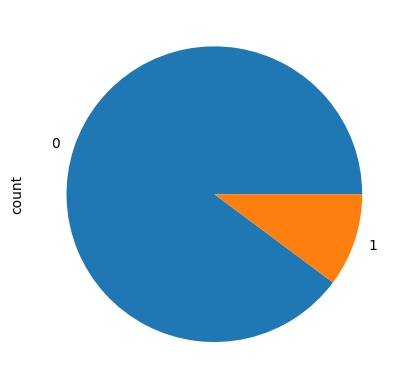

In [158]:
# Calculate and print the percentage distribution of each class in 'churn_probability' this helps understand class imbalance in percentage terms
print((telecomDF['churn_probability'].value_counts() / len(telecomDF)) * 100)

# Plot a pie chart to visually represent the class distribution useful for quickly identifying imbalance between churners and non-churners
((telecomDF['churn_probability'].value_counts() / len(telecomDF)) * 100).plot(kind="pie")

# Display the plot
plt.show()

In [159]:
# Display columns with missing values less than or equal to 70% these columns are typically retained and require further handling (e.g., imputation)
missing_df_data[missing_df_data.Percent <= 70]

,Sum,Percent
std_og_t2c_mou_8,3703,5.290076
std_og_t2f_mou_8,3703,5.290076
roam_og_mou_8,3703,5.290076
std_og_t2m_mou_8,3703,5.290076
std_og_t2t_mou_8,3703,5.290076
...,...,...
aon,0,0.000000
aug_vbc_3g,0,0.000000
jul_vbc_3g,0,0.000000
jun_vbc_3g,0,0.000000


In [160]:
# Replace all missing (NaN) values in the DataFrame with 0 this is commonly used when missing values represent "no activity" (e.g., no calls, no recharge)
telecomDF = telecomDF.fillna(0)

In [161]:
# Replace all missing (NaN) values in the DataFrame with 0 this is commonly used when missing values represent "no activity" (e.g., no calls, no recharge)
telecomDF = telecomDF.fillna(0)

In [162]:
# Get the dimensions of the DataFrame: (number of rows, number of columns)
telecomDF.shape

(69999, 142)

In [163]:
# Initialize original_shape with the shape of the DataFrame before any preprocessing steps based on previous execution, the original shape was (69999, 172)
original_shape = (69999, 172)

# Print the original shape of the dataset before preprocessing helps establish a baseline for comparison
print("Before:", original_shape)

# Print the shape of the dataset after preprocessing used to verify how many rows/columns were removed or retained after cleaning steps
print("After:", telecomDF.shape)

Before: (69999, 172)
After: (69999, 142)


In [164]:
# Calculate the total number of missing (NaN) values in the entire DataFrame
# 1. First .isna() creates a boolean mask, first .sum() gives column-wise counts,
# 2. Second .sum() aggregates to a single total count
telecomDF.isna().sum().sum()

np.int64(0)

In [165]:
# Re-check statistical summary of numerical features after data cleaning ensures that missing values are handled and data distributions look reasonable
telecomDF.describe()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.000000,69999.0,69999.0,69999.0,69999.0,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.0,69999.0,69999.0,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.0,69999.0,69999.0,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.00000,69999.000000
mean,34999.000000,109.0,0.0,0.0,0.0,283.134365,278.185912,278.858826,127.887939,128.754731,125.943607,191.010582,189.585401,186.146273,9.379276,6.745305,6.634328,13.625476,9.464386,9.254848,45.050076,44.394344,43.269280,89.551272,87.313796,86.301054,3.595161,3.632045,3.467948,1.081499,1.308807,1.345676,138.203540,135

In [166]:
# Identify columns that have only one unique value (no variance) such columns do not provide useful information for model learning
unique_values_equals_1 = []
# Iterate through all columns in the DataFrame
for i in telecomDF.columns:
    # Check if the column has only one unique value
    if telecomDF[i].nunique() == 1:
        # Add column name to the list for removal
        unique_values_equals_1.append(i)
    else:
        # Do nothing if column has more than one unique values
        pass
# Print the list of columns to be dropped
print("\n List of columns to be dropped from the dataset with only 1 unique value are :\n",unique_values_equals_1)
# Drop the identified columns from the DataFrame
telecomDF.drop(unique_values_equals_1, axis=1, inplace=True)


 List of columns to be dropped from the dataset with only 1 unique value are :
 ['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'last_date_of_month_6', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8']


In [167]:
# Based on statistical analysis and domain understanding: 'id' is a unique identifier for each customer → no predictive value
# List of columns to be removed (including 'last_date_of_month_X' as they are not informative)
drop_cols = ['id', 'last_date_of_month_7', 'last_date_of_month_8']

# Filter drop_cols to only include columns that actually exist in the DataFrame
existing_drop_cols = [col for col in drop_cols if col in telecomDF.columns]

# Drop these non-informative columns from the DataFrame
# axis=1 → drop columns, inplace=True → modify original DataFrame
telecomDF.drop(existing_drop_cols, inplace=True, axis=1)

In [168]:
# Filter the dataset to include only customers who have churned (churn_probability = 1) this subset helps in analyzing behavior patterns of churned customers specifically
telecom_churn = telecomDF[telecomDF['churn_probability'] == 1]

In [169]:
# Generate descriptive statistics for numerical features of churned customers only helps analyze behavior patterns (usage, recharge, etc.) of customers who have churned
telecom_churn.describe()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.00000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.00000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.000000,7132.0
mean,308.289067,219.081400,114.226380,166.784865,115.935868,49.731139,208.525578,146.238458,62.277647,16.007982,15.519393,14.477426,24.591959,21.067705,20.169801,27.382006,17.480652,7.165370,53.537061,36.110890,14.330600,1.660059,1.291847,0.656748,1.072225,1.327782,0.578655,82.584096,54.887182,22.154563,129.064177,89.399222,33.810116,134.04394,92.975660,34.441896,0.574268,0.487637,0.176948,263.685440,182.864829,68.430024,1.407658,0.873006,0.521457,4.128840,4.236813,1.515799,0.557518,0.010646,0.000530,352.370766,242.877399,92.624937,30.374544,21.802458,7.649083,62.135808,41.270276,16.614169,5.194547,3.662371,1.326970,97.710658,66.739523,25.592482,10.729403,8.061321,2.938589,21.066706,13.852450,

In [170]:
# Create a copy of the original DataFrame for exploratory data analysis (EDA) this ensures that any changes made during EDA do not affect the main dataset
telecom_eda_df = telecomDF.copy()

In [171]:
# Create a working reference to the EDA DataFrame
data = telecom_eda_df

# Convert 'aon' (Age on Network in days) into months to represent customer tenure this helps in understanding how long a customer has been with the telecom operator
data['tenure'] = data['aon'] / 30

# Display first few values of the newly created tenure feature
data['tenure'].head()

# Define bins (ranges) for tenure in months these ranges segment customers based on their duration with the company
tenure_range = [0, 6, 12, 24, 60, 61]

# Define labels corresponding to each tenure range
tenure_label = ['0-6 Months', '6-12 Months', '1-2 Yrs', '2-5 Yrs', '5 Yrs and above']

# Categorize customers into tenure groups using pd.cut() this converts continuous tenure into meaningful segments for analysis
data['tenure_range'] = pd.cut(data['tenure'], tenure_range, labels=tenure_label)

# Display first few values of the tenure range categories
data['tenure_range'].head()

,tenure_range
0,NaN
1,1-2 Yrs
2,2-5 Yrs
3,2-5 Yrs
4,1-2 Yrs


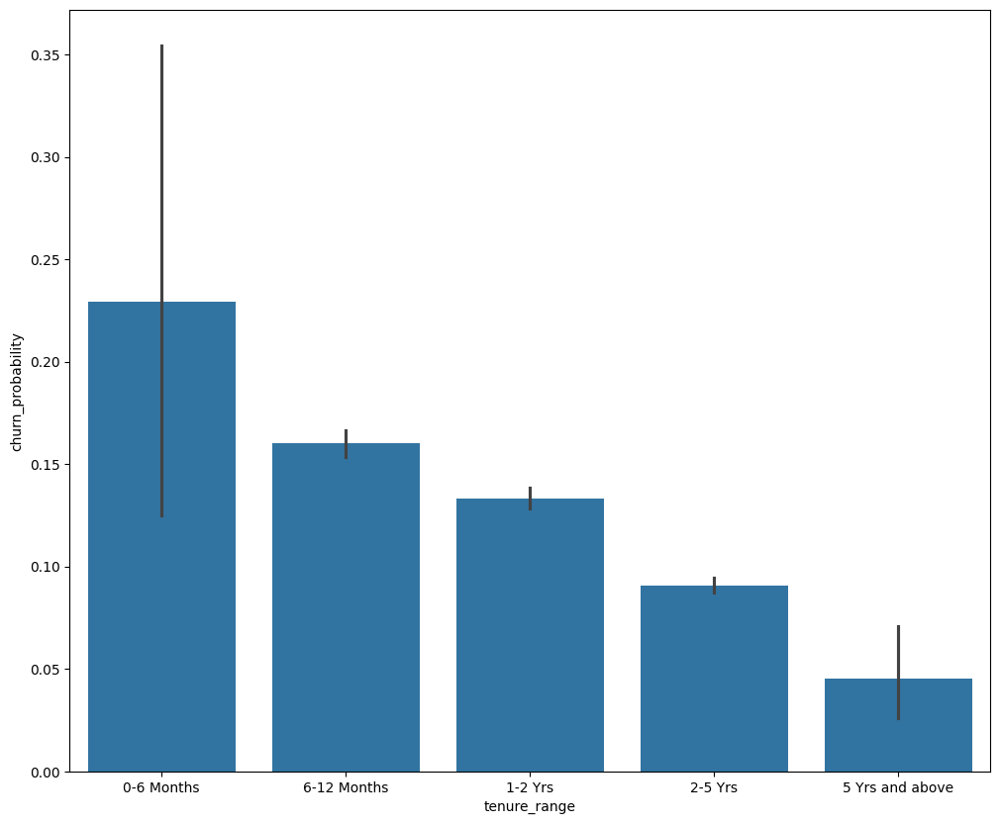

In [172]:
# Create a figure with specified size for better visualization
plt.figure(figsize=[12,10])

# Plot a bar chart showing average churn probability for each tenure range
# x-axis → tenure segments
# y-axis → average churn rate (mean of churn_probability)
sns.barplot(x='tenure_range', y='churn_probability', data=telecom_eda_df)

# Display the plot
plt.show()

Plot shows that churn probability is highest for new customers and decreases consistently as tenure increases. This indicates that the early lifecycle stage is critical for retention. Customers who remain beyond the first 6 months tend to become progressively more loyal. This insight suggests focusing retention strategies on onboarding and early engagement.

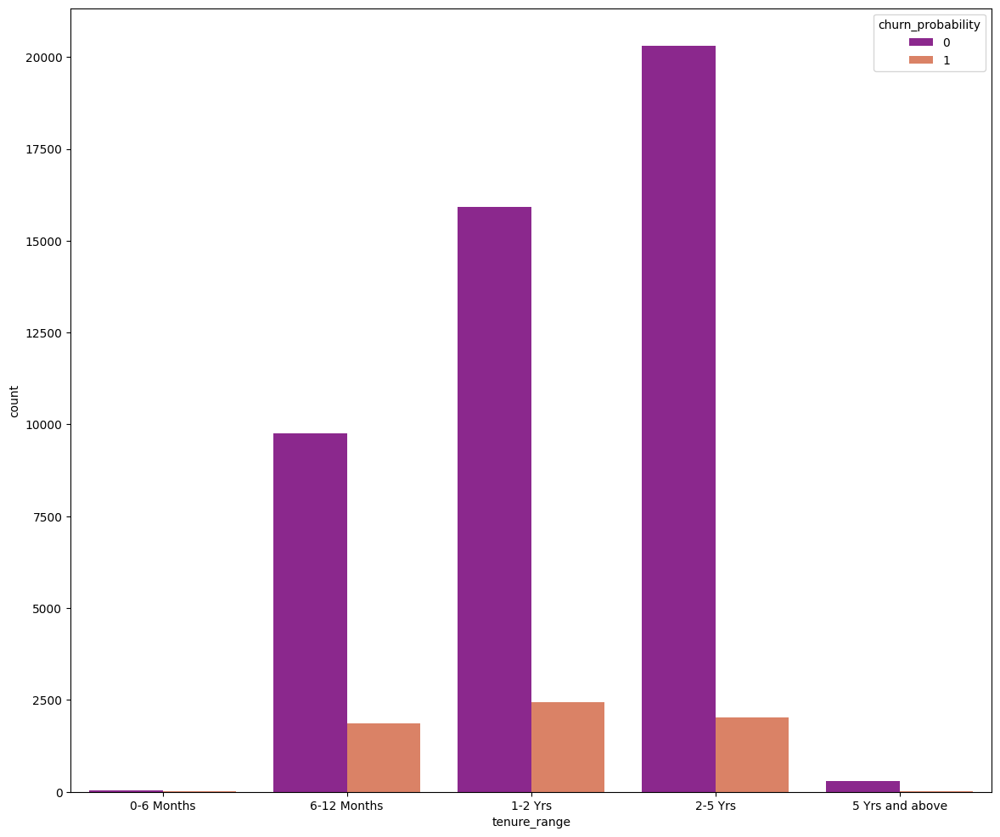

In [173]:
# Create a larger figure for better readability
plt.figure(figsize=(14,12))

# Plot count of customers in each tenure range, split by churn vs non-churn
# 1. x-axis → tenure segments
# 2. hue → churn status (0 = non-churn, 1 = churn)
# 3. palette → color theme for better visualization
sns.countplot(x='tenure_range', hue='churn_probability', data=data, palette=("plasma"))

# Display the plot
plt.show()

Plot shows the distribution of churn across tenure segments. While early-stage customers have higher churn rates, the majority of churn events occur in the 1–2 year segment due to a larger customer base. This indicates that both churn rate and segment size must be considered when prioritizing retention strategies.

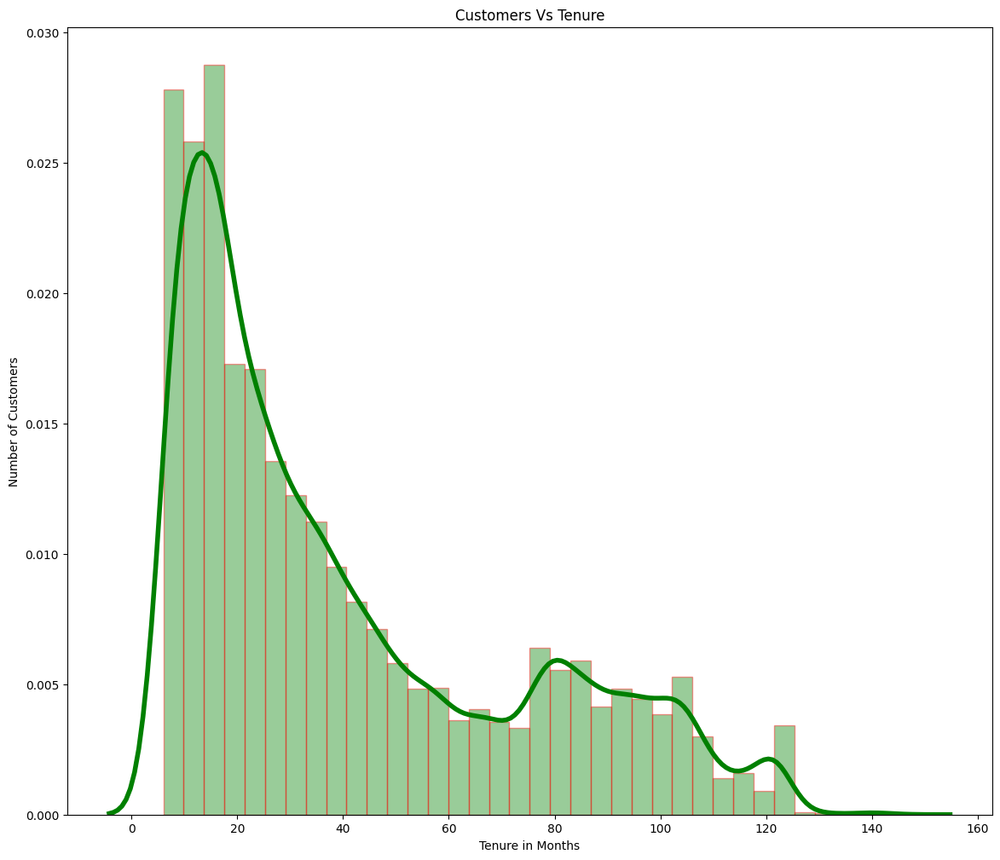

In [174]:
# Create a large figure for better visualization
plt.figure(figsize=(14,12))

# Reference the EDA dataset
data = telecom_eda_df

# Plot the distribution (histogram) of customer tenure
# 1. hist=True → show histogram (frequency of customers)
# 2. kde=False → no density curve
# 3. bins=int(180/5) → divide tenure into intervals (approx every 5 months)
# 4. color → bar color, hist_kws → styling edges
ax = sns.distplot(data['tenure'],hist=True,kde=True,bins=int(180/5),color='green',hist_kws={'edgecolor': 'red'},kde_kws={'linewidth': 4})

# Label the axes
ax.set_ylabel('Number of Customers')
ax.set_xlabel('Tenure in Months')

# Set plot title
ax.set_title('Customers Vs Tenure')

# Display the plot
plt.show()

Plot Show tenure distribution is right-skewed, indicating that most customers are relatively new, with fewer long-term users. This aligns with churn behavior, where early-stage customers are more likely to churn. The long tail represents loyal, high-value customers. This highlights the importance of focusing retention efforts on the early lifecycle stage

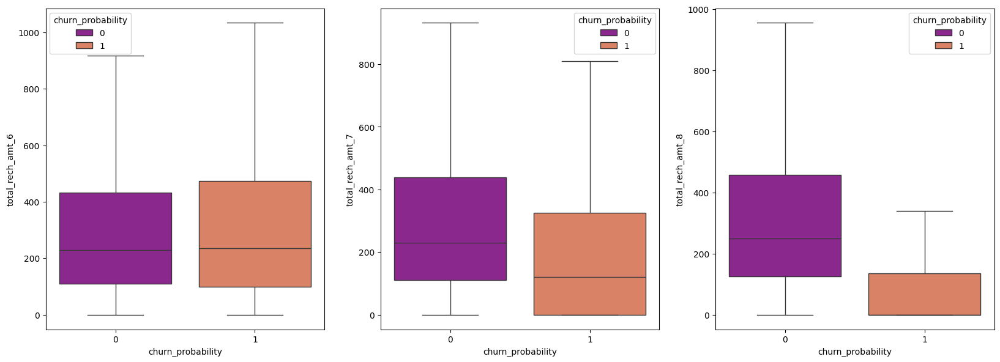

In [175]:
# Create a large figure to display multiple subplots clearly
plt.figure(figsize=(20,15))

# Reference the EDA dataset
data = telecom_eda_df

# ---------------- Month 6 ----------------
# 1. x-axis → churn (0 = non-churn, 1 = churn)
# 2. y-axis → recharge amount
# 3. showfliers=False → remove extreme outliers for better visualization
plt.subplot(2,3,1)
sns.boxplot(data=data,y="total_rech_amt_6",x="churn_probability",hue="churn_probability",showfliers=False,palette=("plasma"))

# Same analysis for month 7
plt.subplot(2,3,2)
sns.boxplot(data=data,y="total_rech_amt_7",x="churn_probability",hue="churn_probability",showfliers=False,palette=("plasma"))

# Same analysis for month 8
plt.subplot(2,3,3)
sns.boxplot(data=data,y="total_rech_amt_8",x="churn_probability",hue="churn_probability",showfliers=False,palette=("plasma"))

# Display all plots
plt.show()

Boxplots show a clear behavioral trend where churned customers exhibit a significant decline in recharge amounts over time, especially between months 7 and 8. While month 6 shows similar behavior across both groups, divergence begins in month 7 and becomes pronounced in month 8, indicating that churn is preceded by a gradual reduction in engagement

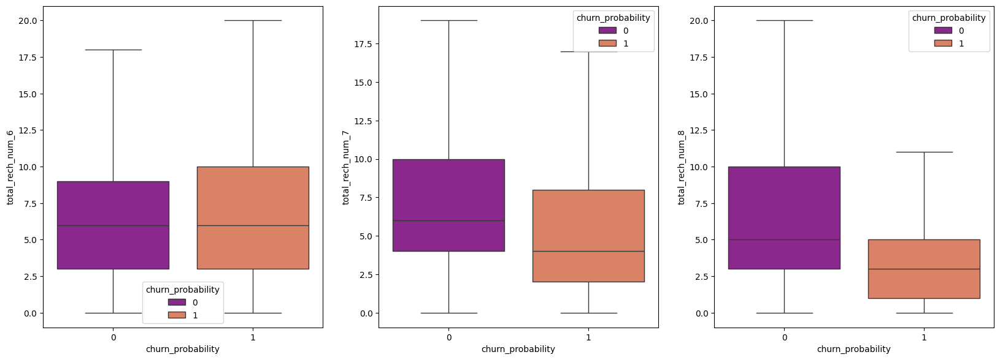

In [176]:
# Create a large figure to display multiple boxplots clearly
plt.figure(figsize=(20,15))

# Reference the EDA dataset
data = telecom_eda_df

# ---------------- Month 6 ----------------
# Boxplot of number of recharges in month 6 vs churn
# 1. x-axis → churn status (0 = non-churn, 1 = churn)
# 2. y-axis → number of recharges
plt.subplot(2,3,1)
sns.boxplot(data=data,y="total_rech_num_6",x="churn_probability",hue="churn_probability",showfliers=False,palette=("plasma"))

# Boxplot for recharge count in month 7
plt.subplot(2,3,2)
sns.boxplot(data=data,y="total_rech_num_7",x="churn_probability",hue="churn_probability",showfliers=False,palette=("plasma"))

# Boxplot for recharge count in month 8
plt.subplot(2,3,3)
sns.boxplot(data=data,y="total_rech_num_8",x="churn_probability",hue="churn_probability",showfliers=False,palette=("plasma"))

# Display all plots
plt.show()

Boxplots show that churned customers exhibit a clear decline in recharge frequency over time. While behavior is similar in earlier months, divergence begins in month 7 and becomes significant in month 8, indicating that reduced engagement is a strong precursor to churn

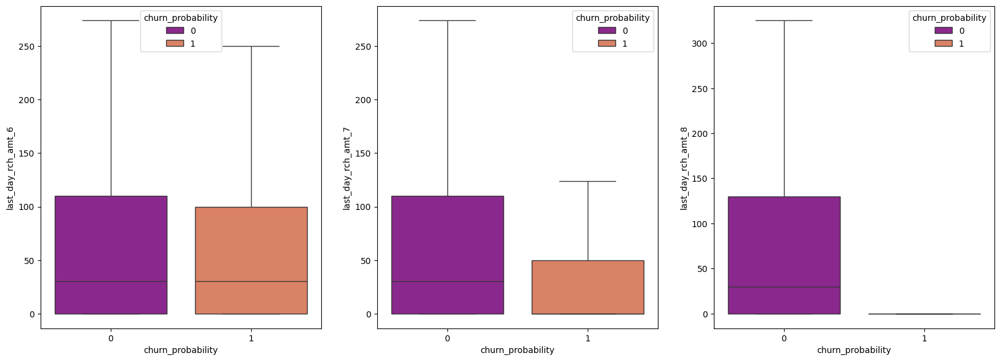

In [177]:
# Create a large figure for better visualization of multiple plots
plt.figure(figsize=(20,15))

# Reference the EDA dataset
data = telecom_eda_df

# ---------------- Month 6 ----------------
plt.subplot(2,3,1)
sns.boxplot(data=data,y="last_day_rch_amt_6",x="churn_probability",hue="churn_probability",showfliers=False,palette=("plasma"))

# ---------------- Month 7 ----------------
plt.subplot(2,3,2)
sns.boxplot(data=data,y="last_day_rch_amt_7",x="churn_probability",hue="churn_probability",showfliers=False,palette=("plasma"))

# ---------------- Month 8 ----------------
plt.subplot(2,3,3)
sns.boxplot(data=data,y="last_day_rch_amt_8",x="churn_probability",hue="churn_probability",showfliers=False,palette=("plasma"))

# Display all plots
plt.show()

Boxplots show that the last recharge amount drops significantly for churned customers, especially in the final month where it approaches zero. This indicates that recency of activity is a strong indicator of churn, as customers tend to stop recharging completely before leaving

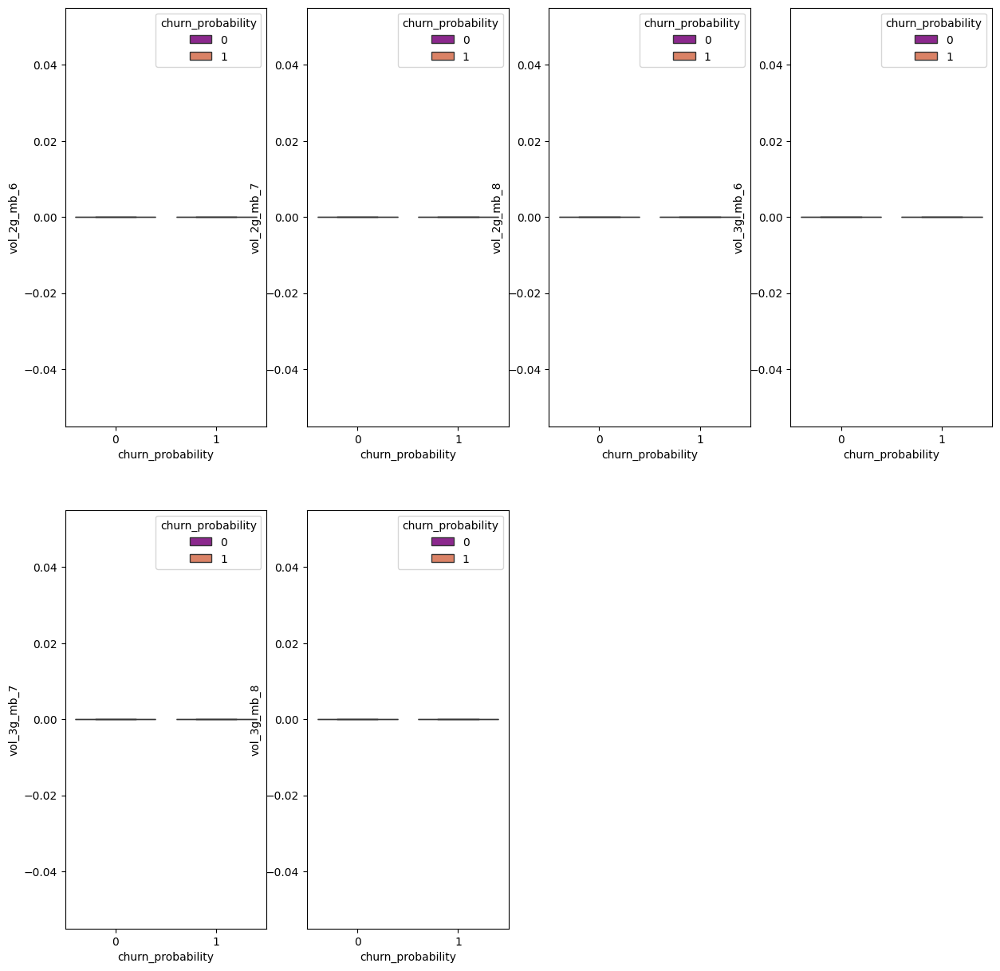

In [178]:
# Create a large figure to accommodate multiple subplots
plt.figure(figsize=(15,15))

# Reference the EDA dataset
data = telecom_eda_df

# ---------------- 2G Data Usage ----------------
# Month 6: 2G data usage vs churn
plt.subplot(2,4,1)
sns.boxplot(data=data,y="vol_2g_mb_6",x="churn_probability",hue="churn_probability",showfliers=False,palette=("plasma"))

# Month 7: 2G usage vs churn
plt.subplot(2,4,2)
sns.boxplot(data=data,y="vol_2g_mb_7",x="churn_probability",hue="churn_probability",showfliers=False,palette=("plasma"))

# Month 8: 2G usage vs churn
plt.subplot(2,4,3)
sns.boxplot(data=data,y="vol_2g_mb_8",x="churn_probability",hue="churn_probability",showfliers=False,palette=("plasma"))

# ---------------- 3G Data Usage ----------------
# Month 6: 3G data usage vs churn
plt.subplot(2,4,4)
sns.boxplot(data=data,y="vol_3g_mb_6",x="churn_probability",hue="churn_probability",showfliers=False,palette=("plasma"))

# Month 7: 3G usage vs churn
plt.subplot(2,4,5)
sns.boxplot(data=data,y="vol_3g_mb_7",x="churn_probability",hue="churn_probability",showfliers=False,palette=("plasma"))

# Month 8: 3G usage vs churn
plt.subplot(2,4,6)
sns.boxplot(data=data,y="vol_3g_mb_8",x="churn_probability",hue="churn_probability",showfliers=False,palette=("plasma"))

# Display all plots
plt.show()

Boxplots show no variation in 2G and 3G usage across churn classes, indicating that these features are either not used by customers or were affected by preprocessing. Since they have near-zero variance, they do not contribute to model learning and should be removed.

In [179]:
# Select column names that contain 'vol_2g' or 'vol_3g' using regex pattern matching
# this helps identify all 2G and 3G data usage-related features in the dataset
volume_2g_3g = telecom_eda_df.columns[telecom_eda_df.columns.str.contains('vol_2g|vol_3g', regex=True)]

# Convert the selected column names (Index object) into a Python list for easier viewing/manipulation
volume_2g_3g.tolist()

['vol_2g_mb_6',
 'vol_2g_mb_7',
 'vol_2g_mb_8',
 'vol_3g_mb_6',
 'vol_3g_mb_7',
 'vol_3g_mb_8']

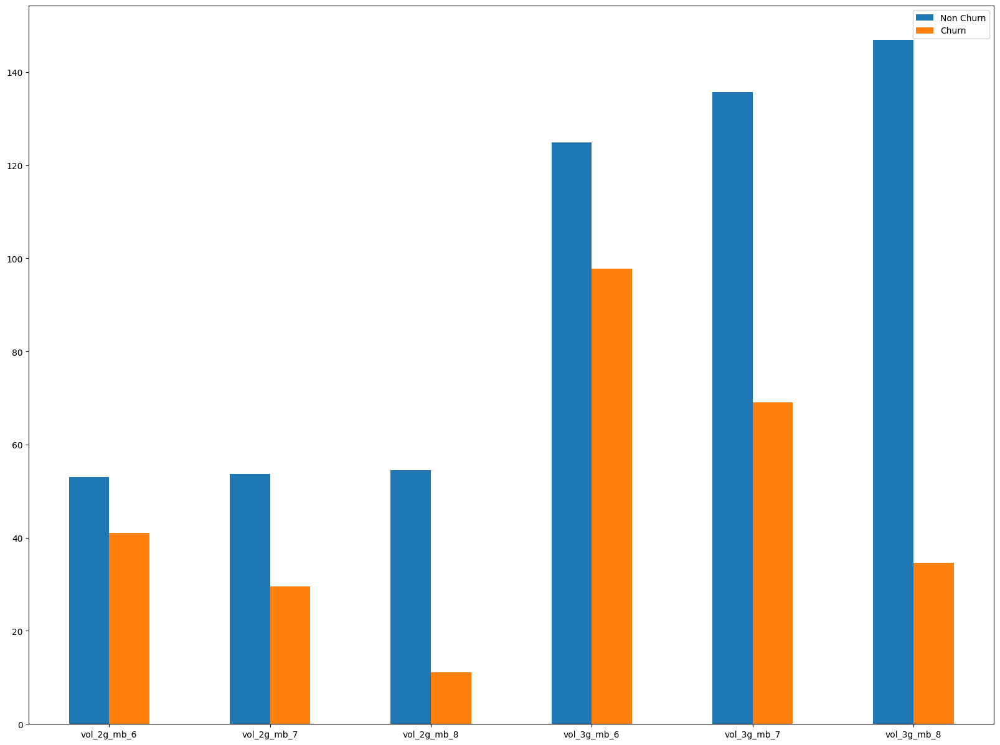

In [180]:
# Filter dataset for non-churned customers (churn_probability = 0) and select only 2G/3G usage-related columns
df_0 = telecom_eda_df[telecom_eda_df.churn_probability == 0].filter(volume_2g_3g)

# Filter dataset for churned customers (churn_probability = 1) and select the same 2G/3G usage columns
df_1 = telecom_eda_df[telecom_eda_df.churn_probability == 1].filter(volume_2g_3g)

# Compute mean usage of each 2G/3G feature for non-churned customers and store it as a single-row DataFrame
mean_df_0 = pd.DataFrame([df_0.mean()], index=['Non Churn'])

# Compute mean usage for churned customers
mean_df_1 = pd.DataFrame([df_1.mean()], index=['Churn'])

# Combine both DataFrames into one for comparison
frames = [mean_df_0, mean_df_1]
mean_bar = pd.concat(frames)

# Transpose the DataFrame so that features are on x-axis and plot a bar chart comparing mean usage between churn vs non-churn
mean_bar.T.plot.bar(figsize=(20, 15), rot=0)

# Display the plot
plt.show()

Plot shows that non-churned customers consistently have higher data usage compared to churned customers. More importantly, churned customers exhibit a clear declining trend in both 2G and 3G usage over time, while non-churners maintain or increase their usage. This indicates that decreasing engagement is a strong predictor of churn

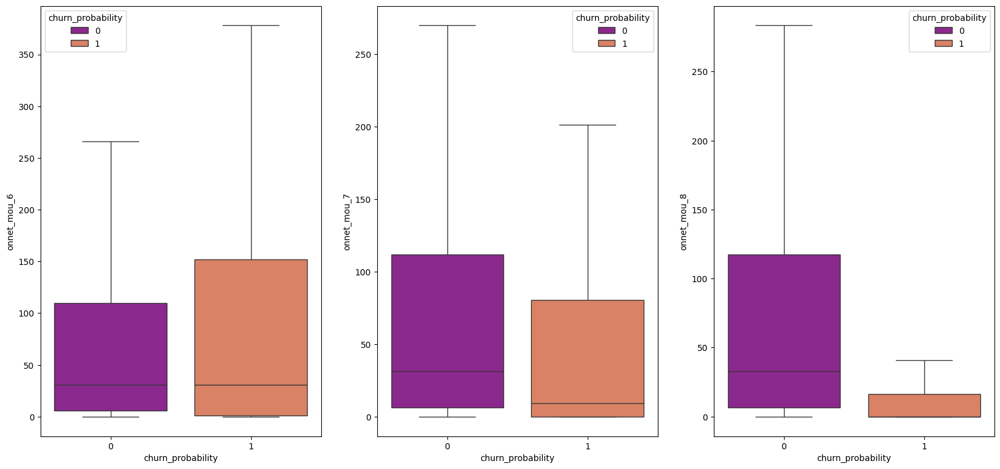

In [181]:
# Create a large figure to clearly display multiple boxplots
plt.figure(figsize=(20,20))

# Reference the EDA dataset
data = telecom_eda_df

# ---------------- Month 6 ----------------
# Boxplot of on-network call minutes (same network calls) vs churn status
# 1. x-axis → churn (0 = non-churn, 1 = churn)
# 2. y-axis → total on-network call minutes
plt.subplot(2,3,1)
sns.boxplot(data=data,y="onnet_mou_6",x="churn_probability",hue="churn_probability",showfliers=False,palette=("plasma"))

# ---------------- Month 7 ----------------
# Boxplot for on-network call usage in month 7 vs churn
plt.subplot(2,3,2)
sns.boxplot(data=data,y="onnet_mou_7",x="churn_probability",hue="churn_probability",showfliers=False,palette=("plasma"))

# ---------------- Month 8 ----------------
# Boxplot for on-network call usage in month 8 vs churn
plt.subplot(2,3,3)
sns.boxplot(data=data,y="onnet_mou_8",x="churn_probability",hue="churn_probability",showfliers=False,palette=("plasma"))

# Display all the plots
plt.show()

Boxplots show that churned customers exhibit a significant decline in on-network call usage over time. While behavior is similar in earlier months, a clear divergence appears in month 7 and becomes pronounced in month 8, where churners show near-zero activity. This indicates that reduced communication engagement is a strong precursor to churn

In [182]:
# Select column names that match the pattern:'^onnet.*mou' → columns starting with 'onnet' and containing 'mou' this captures all on-network call usage features (minutes of usage)
onnet_usage_service = telecom_eda_df.columns[telecom_eda_df.columns.str.contains('^onnet.*mou', regex=True)]

# Convert the resulting column Index into a Python list for easy viewing/manipulation
onnet_usage_service.tolist()

['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8']

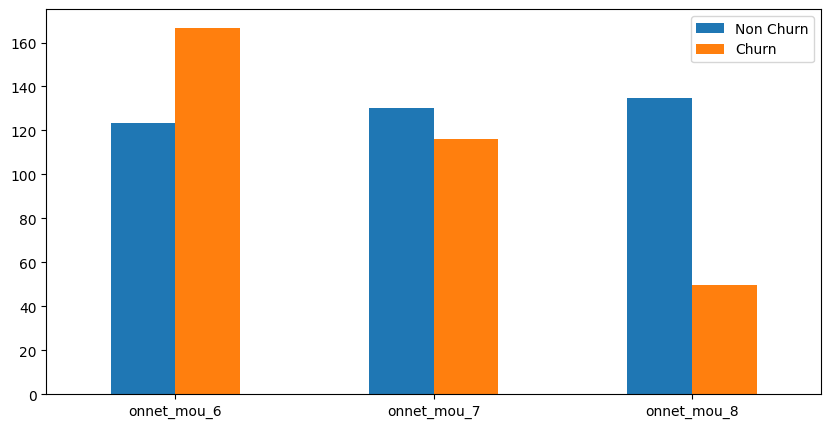

In [183]:
# Filter dataset for non-churned customers (churn_probability = 0) and select only on-network usage (minutes of usage) features
df_0 = telecom_eda_df[telecom_eda_df.churn_probability == 0].filter(onnet_usage_service)

# Filter dataset for churned customers (churn_probability = 1) and select the same on-network usage features
df_1 = telecom_eda_df[telecom_eda_df.churn_probability == 1].filter(onnet_usage_service)

# Compute mean on-network usage for non-churned customers result is a single-row DataFrame labeled 'Non Churn'
mean_df_0 = pd.DataFrame([df_0.mean()], index=['Non Churn'])

# Compute mean on-network usage for churned customers result is a single-row DataFrame labeled 'Churn'
mean_df_1 = pd.DataFrame([df_1.mean()], index=['Churn'])

# Combine both DataFrames to compare churn vs non-churn
frames = [mean_df_0, mean_df_1]
mean_bar = pd.concat(frames)

# Plot a bar chart comparing average on-network usage between churn groups and transpose the DataFrame so that features appear on x-axis
mean_bar.T.plot.bar(figsize=(10,5), rot=0)

# Display the plot
plt.show()

Plot shows that churned customers initially have high call usage but exhibit a sharp decline over time, especially between months 7 and 8. In contrast, non-churners maintain or increase their usage. This indicates that churn is driven by a drop in engagement rather than low usage itself

In [184]:
# Select column names that match the pattern:'.*_og_.*mou_6' → columns related to outgoing (og) minutes of usage (mou) for month 6 this dynamically filters all outgoing call usage features for month 6
mou_og_cols6 = telecom_eda_df.columns[telecom_eda_df.columns.str.contains('.*_og_.*mou_6', regex=True)]

In [185]:
# Select only the outgoing call usage columns for month 6 using .loc and generate descriptive statistics (count, mean, std, min, quartiles, max) this helps understand distribution and variability of outgoing call behavior
telecom_eda_df.loc[:, mou_og_cols6].describe()

,roam_og_mou_6,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_mou_6,std_og_t2t_mou_6,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_mou_6,isd_og_mou_6,spl_og_mou_6,total_og_mou_6
count,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000
mean,13.625476,45.050076,89.551272,3.595161,1.081499,138.203540,77.431415,84.666274,1.081836,163.182149,0.812319,3.802082,306.451436
std,72.055036,148.238746,159.846546,13.073900,5.631416,248.587898,250.496889,251.251454,7.977166,385.640962,29.153852,15.557032,465.502866
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.010000,7.290000,0.000000,0.000000,12.960000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,44.780000
50%,0.000000,10.660000,37.680000,0.000000,0.000000,59.990000,0.000000,2.910000,0.000000,9.250000,0.000000,0.000000,145.280000
75%,0.000000,38.680000,105.685000,1.860000,0.000000,161.485000,27.160000,49.150000,0.000000,133.890000,0.000000,2.150000,374.305000
max,3775.110000,6431.330000,4696.830000,617.580000,342.860000,10643.380000,7366.580000,8314.760000,628.560000,8432.990000,5900.660000,1023.210000,10674.030000


In [186]:
# Normalize by group
pd.crosstab(data['tenure_range'], data['churn_probability'], normalize='index')

churn_probability,0,1
tenure_range,,
0-6 Months,0.770833,0.229167
6-12 Months,0.839993,0.160007
1-2 Yrs,0.866787,0.133213
2-5 Yrs,0.909217,0.090783
5 Yrs and above,0.954839,0.045161


In [187]:
# Create new features to capture month-over-month recharge amount changes:
# 1. rech_drop_7_6 → difference between July (month 7) and June (month 6) recharge amounts
# 2. rech_drop_8_7 → difference between August (month 8) and July (month 7) recharge amounts
# 3. Positive value → increase in recharge, Negative value → drop in recharge (possible churn signal)
data['rech_drop_7_6'] = data['total_rech_amt_7'] - data['total_rech_amt_6']
data['rech_drop_8_7'] = data['total_rech_amt_8'] - data['total_rech_amt_7']

In [188]:
# Create features to capture overall recharge behavior trend from June (month 6) to August (month 8):
# 1. rech_trend → absolute change in recharge amount over the period (Aug - June)
# 2. Positive value indicates growth, negative indicates decline (potential churn signal)
data['rech_trend'] = data['total_rech_amt_8'] - data['total_rech_amt_6']
# 3. rech_ratio → relative change (ratio) of August recharge to June recharge
# 4. Adding +1 in denominator avoids division by zero when June recharge is 0
# 5. Values >1 indicate increase, <1 indicate decrease in recharge behavior
data['rech_ratio'] = data['total_rech_amt_8'] / (data['total_rech_amt_6'] + 1)

In [189]:
# Create features to capture changes in recharge frequency (number of recharges) from June (month 6) to August (month 8):
# 1. rech_freq_drop → absolute change in recharge count (Aug - June)
# 2. Positive value indicates more frequent recharges, negative indicates reduced activity (possible churn signal)
data['rech_freq_drop'] = data['total_rech_num_8'] - data['total_rech_num_6']
# 3. rech_freq_ratio → relative change (ratio) of recharge frequency in August compared to June
# 4. Adding +1 in denominator prevents division by zero when June recharge count is 0
# 5. Values >1 indicate increased frequency, <1 indicate decreased frequency
data['rech_freq_ratio'] = data['total_rech_num_8'] / (data['total_rech_num_6'] + 1)

In [190]:
# Create features related to last recharge behavior:
# 1. last_rech_flag_8 → binary flag indicating whether there was NO recharge on the last day of August
# 2. (1 = no recharge, 0 = recharge happened)
data['last_rech_flag_8'] = (data['last_day_rch_amt_8'] == 0).astype(int)
# 3. last_rech_drop → change in last day recharge amount from June to August (Aug - June)
# 4. Negative value may indicate reduced engagement or potential churn signal
data['last_rech_drop'] = data['last_day_rch_amt_8'] - data['last_day_rch_amt_6']

In [191]:
# Drop raw 2G and 3G data usage columns for months 6, 7, and 8 these features are likely removed due to redundancy, high correlation, or after creating derived features
# 1. axis=1 → specifies column-wise deletion
# 2. inplace=True → modifies the original dataframe directly without creating a copy
telecomDF.drop(['vol_2g_mb_6','vol_2g_mb_7','vol_2g_mb_8','vol_3g_mb_6','vol_3g_mb_7','vol_3g_mb_8'], axis=1, inplace=True)

In [192]:
# Create features to capture change in 3G data usage from June (month 6) to August (month 8):
# 1. data_usage_drop_3g → absolute change in 3G data usage (Aug - June)
# 2. Positive value indicates increased usage, negative indicates decline (potential churn signal)
data['data_usage_drop_3g'] = data['vol_3g_mb_8'] - data['vol_3g_mb_6']
# 3. data_usage_ratio → relative change (ratio) of August 3G usage compared to June
# 4. Adding +1 in denominator prevents division by zero when June usage is 0
# 5. Values >1 indicate increased usage, <1 indicate decreased usage
data['data_usage_ratio'] = data['vol_3g_mb_8'] / (data['vol_3g_mb_6'] + 1)

In [193]:
# Create features to capture change in on-network call usage (same operator calls) from June (month 6) to August (month 8):
# 1. onnet_drop → absolute change in on-network minutes of usage (Aug - June)
# 2. Positive value indicates increased calling activity, negative indicates reduced usage (possible churn signal)
data['onnet_drop'] = data['onnet_mou_8'] - data['onnet_mou_6']
# 3. onnet_ratio → relative change (ratio) of August on-network usage compared to June
# 4. Adding +1 in denominator prevents division by zero when June usage is 0
# 5. Values >1 indicate increased usage, <1 indicate decreased usage
data['onnet_ratio'] = data['onnet_mou_8'] / (data['onnet_mou_6'] + 1)

In [194]:
# Select all outgoing call usage (mou) columns for month 6 using .loc and generate descriptive statistics (count, mean, std, min, quartiles, max)
# Helps understand the distribution, spread, and presence of outliers in outgoing usage features
telecom_eda_df.loc[:, mou_og_cols6].describe()

,roam_og_mou_6,loc_og_t2t_mou_6,loc_og_t2m_mou_6,loc_og_t2f_mou_6,loc_og_t2c_mou_6,loc_og_mou_6,std_og_t2t_mou_6,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_mou_6,isd_og_mou_6,spl_og_mou_6,total_og_mou_6
count,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000
mean,13.625476,45.050076,89.551272,3.595161,1.081499,138.203540,77.431415,84.666274,1.081836,163.182149,0.812319,3.802082,306.451436
std,72.055036,148.238746,159.846546,13.073900,5.631416,248.587898,250.496889,251.251454,7.977166,385.640962,29.153852,15.557032,465.502866
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.010000,7.290000,0.000000,0.000000,12.960000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,44.780000
50%,0.000000,10.660000,37.680000,0.000000,0.000000,59.990000,0.000000,2.910000,0.000000,9.250000,0.000000,0.000000,145.280000
75%,0.000000,38.680000,105.685000,1.860000,0.000000,161.485000,27.160000,49.150000,0.000000,133.890000,0.000000,2.150000,374.305000
max,3775.110000,6431.330000,4696.830000,617.580000,342.860000,10643.380000,7366.580000,8314.760000,628.560000,8432.990000,5900.660000,1023.210000,10674.030000


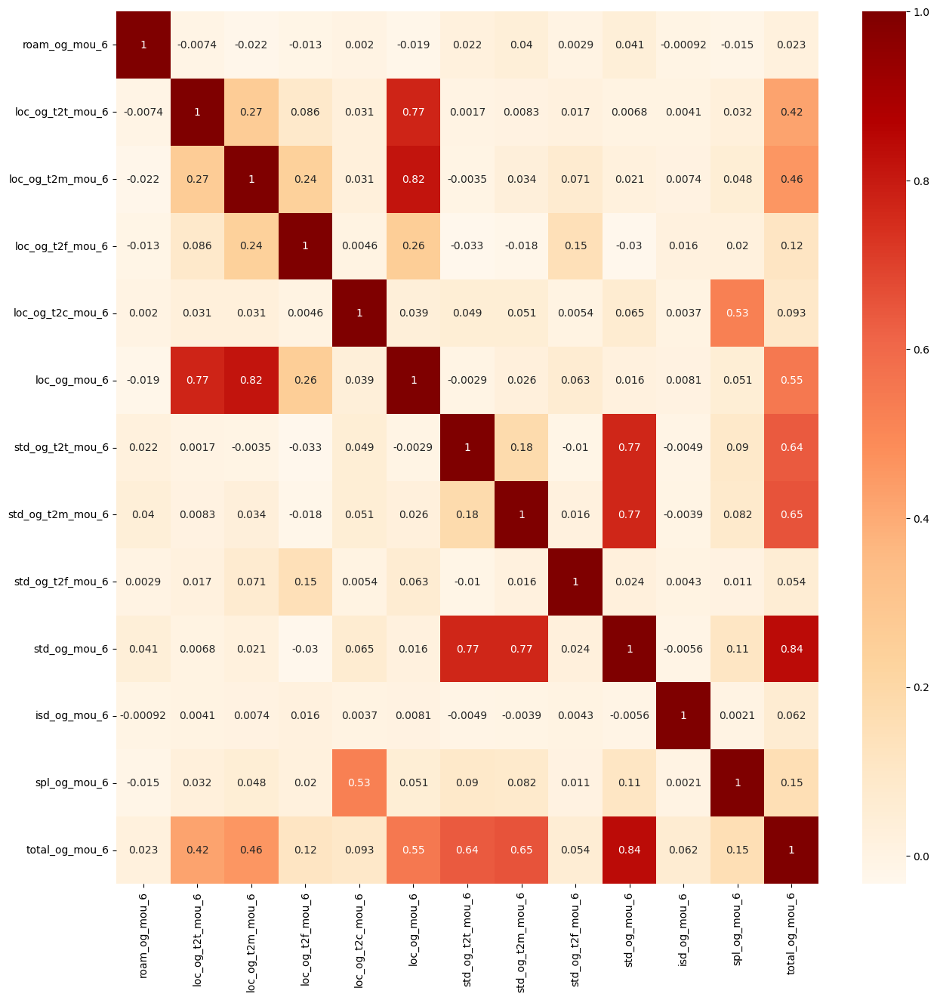

In [195]:
# Create a large figure for better readability of the heatmap
plt.figure(figsize=(15,15))

# Select outgoing call usage (mou) columns for month 6 using filter() compute correlation matrix and visualize it using a heatmap
# 1. cmap="OrRd" → color gradient (Orange-Red) to highlight correlation strength
# 2. annot=True → display correlation values inside the heatmap cells
sns.heatmap(telecom_eda_df.filter(mou_og_cols6).corr(),cmap="OrRd",annot=True)

# Display the heatmap
plt.show()

Heatmap shows strong multicollinearity among outgoing call features, particularly between total and component-level features. This indicates redundancy, and I would either select aggregate features like total outgoing minutes or use tree-based models that can handle correlated inputs

In [196]:
# Create a new feature 'total_og_trend' to capture change in outgoing call usage over time it calculates the difference between month 8 and month 6 total outgoing minutes (mou)
# 1. Positive value → increase in usage
# 2. Negative value → decrease in usage (strong churn signal)
telecom_eda_df['total_og_trend'] = telecom_eda_df['total_og_mou_8'] - telecom_eda_df['total_og_mou_6']

In [197]:
# Define a list of important features selected for modeling these features are chosen based on EDA insights, correlation analysis, and domain knowledge (telecom behavior patterns)
imp_features = [
    'arpu_6', 'arpu_7', 'arpu_8',                 # Average Revenue Per User (monetary value)
    'onnet_mou_8',                               # On-network call usage (recent month → strong signal)
    'offnet_mou_7', 'offnet_mou_8',               # Off-network call usage (trend behavior)
    'roam_ic_mou_8', 'roam_og_mou_8',             # Roaming usage (high-value customer indicator)
    'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8',       # Local outgoing calls (detailed usage)
    'loc_og_mou_7', 'loc_og_mou_8',               # Total local outgoing usage
    'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8',       # Local incoming calls
    'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8',       # Incoming from mobile
    'loc_ic_mou_7', 'loc_ic_mou_8',               # Total incoming usage
    'std_ic_t2m_mou_8',                          # STD incoming usage (long-distance)
    'total_rech_num_7', 'total_rech_num_8',       # Recharge frequency (engagement signal)
    'max_rech_amt_8',                            # Maximum recharge amount (spending behavior)
    'last_day_rch_amt_8',                        # Most recent recharge (recency signal)
    'aon',                                       # Age on network (customer tenure)
    'churn_probability'                          # Target variable (label)
]

In [198]:
# Separate target variable from feature variables
X = telecom_eda_df[imp_features].drop('churn_probability', axis=1)
y = telecom_eda_df['churn_probability']

# Ensure all values in X are non-negative before log transformation
# This replaces any negative value with 0, which log1p can handle (log(1) = 0).
X[X < 0] = 0

# Apply log transformation (log1p = log(1 + x)) to all features in X this helps reduce right skewness, compress extreme values (outliers), and make the data distribution more normal-like for better model performance
for col in X.columns:
    X[col] = np.log1p(X[col])

In [199]:
# Import Logistic Regression model
from sklearn.linear_model import LogisticRegression

# Initialize a Logistic Regression model class_weight='balanced' automatically adjusts weights inversely proportional to class frequencies → helps handle class imbalance (churn is usually minority class)
model = LogisticRegression(class_weight='balanced')

In [200]:
# Import train_test_split to divide the dataset into training and testing sets this helps evaluate model performance on unseen data
from sklearn.model_selection import train_test_split

# Import StandardScaler to normalize/standardize feature values ensures all features have mean = 0 and standard deviation = 1
# Important for models sensitive to feature scale (e.g., Logistic Regression)
from sklearn.preprocessing import StandardScaler

# Split data into training and testing sets
# stratify=y ensures that the proportion of churners is similar in both train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Initialize the scaler object
scaler = StandardScaler()

# Fit the scaler ONLY on training data this computes mean and standard deviation from training set important to avoid data leakage
scaler.fit(X_train)

# Transform training data using learned parameters → scales features to mean=0, std=1
X_train_scaled = scaler.transform(X_train)

# Transform test data using SAME parameters from training data → ensures consistency and fair evaluation
X_test_scaled = scaler.transform(X_test)

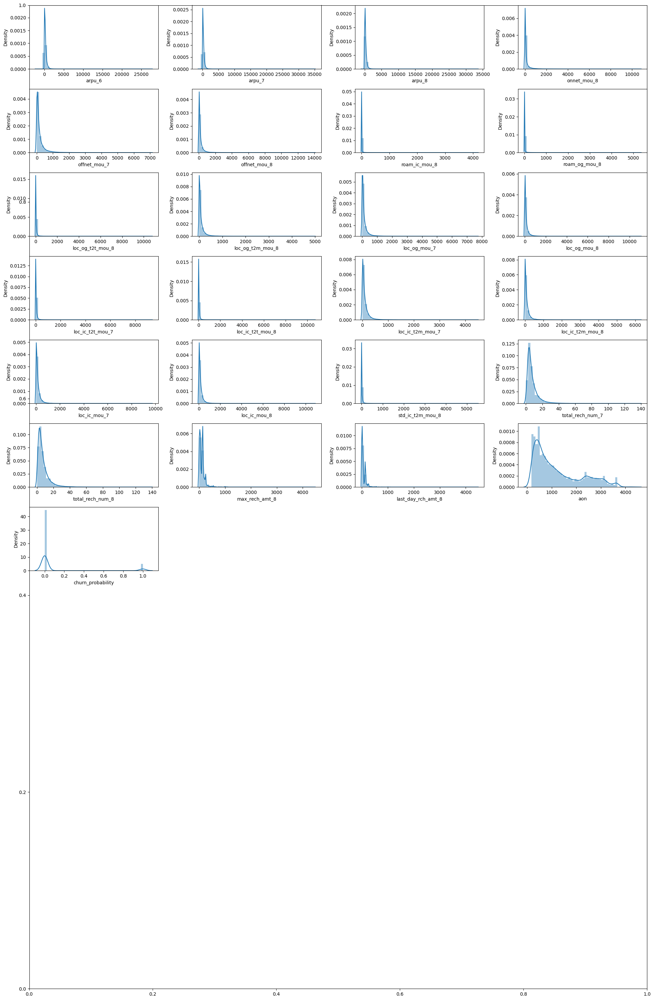

In [201]:
# Create a large figure to visualize distributions of multiple features
fig = plt.subplots(figsize=(20, 30))
# Loop through each feature in the important features list
for i, feature in enumerate(imp_features):
    # Create subplots in a grid (12 rows × 4 columns) i+1 ensures subplot indexing starts from 1
    plt.subplot(12, 4, i+1)
    # Plot distribution (histogram + KDE) of each feature helps understand spread, skewness, and outliers
    sns.distplot(telecom_eda_df[feature])
    # Adjust layout to prevent overlap between plots
    plt.tight_layout()

After applying log transformation, the feature distributions became less skewed and more compact. This reduces the impact of outliers and makes the data more suitable for models like Logistic Regression. While some skewness remains, it is acceptable for real-world datasets.

In [202]:
# Convert recharge date columns from object (string) to datetime format
telecomDF["date_of_last_rech_8"] = pd.to_datetime(telecomDF['date_of_last_rech_8'], errors='coerce')
telecomDF["date_of_last_rech_7"] = pd.to_datetime(telecomDF['date_of_last_rech_7'], errors='coerce')
telecomDF["date_of_last_rech_6"] = pd.to_datetime(telecomDF['date_of_last_rech_6'], errors='coerce')

In [203]:
# Calculate the number of days between last recharge in month 8 and month 7 this captures recent recharge frequency/recency behavior
telecomDF['rchrge2_no_of_days'] = (telecomDF['date_of_last_rech_8'] - telecomDF['date_of_last_rech_7']).dt.days
# Calculate the number of days between last recharge in month 7 and month 6 helps understand earlier recharge interval pattern
telecomDF['rchrge1_no_of_days'] = (telecomDF['date_of_last_rech_7'] - telecomDF['date_of_last_rech_6']).dt.days

In [204]:
# Drop original date columns after extracting useful features recharge gap features these raw datetime columns are no longer needed and may not be
# directly useful for modeling removing them helps reduce dimensionality and avoids redundancy
telecomDF.drop(['date_of_last_rech_8', 'date_of_last_rech_7', 'date_of_last_rech_6'],inplace=True,axis=1)

In [205]:
# Get the number of numerical (non-object) columns in the dataset
len(telecomDF.describe(exclude=['object']).columns)

121

In [206]:
# Create a copy of the telecom dataset to work specifically on high-value customers this ensures that any filtering or transformations do not modify the
# original DataFrame
high_value_cust_df = telecomDF.copy()

In [207]:
# Create a new feature 'arpu' by summing ARPU values from months 6, 7, and 8
# this represents total revenue generated by each customer over the 3-month period useful for identifying high-value customers
high_value_cust_df['arpu'] = (high_value_cust_df['arpu_6'] + high_value_cust_df['arpu_7'] + high_value_cust_df['arpu_8'])

In [208]:
# Calculate the 60th percentile (quantile) of the 'arpu' feature this acts as a threshold to identify high-value customers
limit = high_value_cust_df['arpu'].quantile(0.6)

# Filter the dataset to keep only customers whose ARPU is above the threshold i.e., top 40% revenue-generating customers (high-value segment)
high_value_cust_df = high_value_cust_df[high_value_cust_df['arpu'] > limit]

In [209]:
# Filter only churned customers (churn_probability = 1) from high-value customer dataset this helps analyze behavior of high-value customers who have churned
high_value_cust_corr = high_value_cust_df[high_value_cust_df['churn_probability'] == 1]

# Print the number of churned high-value customers useful to understand class distribution in this filtered dataset
print(len(high_value_cust_corr))

# Display the first 5 rows of the high-value customer dataset helps quickly inspect structure, features, and values after filtering
high_value_cust_df.head(5)

1924


,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,rchrge2_no_of_days,rchrge1_no_of_days,arpu
11,292.724,228.753,418.233,135.54,63.61,177.36,46.39,65.48,92.81,0.00,0.0,0.0,0.00,0.0,0.0,86.39,27.59,82.33,43.28,29.49,83.54,0.58,0.36,0.00,2.53,0.0,0.0,130.26,57.46,165.88,49.14,36.01,95.03,0.00,35.61,9.26,0.0,0.00,0.00,49.14,71.63,104.29,0.0,0.0,0.0,2.53,0.00,0.35,0.0,0.0,0.0,181.94,129.09,270.53,66.34,62.03,115.13,60.46,45.23,61.26,0.38,0.00,0.41,127.19,107.26,176.81,6.73,44.76,86.19,0.00,2.65,18.96,0.00,0.00,0.00,6.73,47.41,105.16,133.93,154.68,281.98,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,10,6,8,410,220,460,110,50,130,110,50,50,0,0,0,0,0,0,0,0,0,0,0,0,648,0.0,0.0,0.0,0,27.0,33.0,939.710
12,439.919,397.946,392.024,244.46,108.31,42.98,571.98,727.91,644.43,0.00,0.0,0.0,0.00,0.0,0.0,0.00,7.86,3.98,44.01,13.93,51.24,0.00,0.00,0.00,0.00,0.0,0.0,44.01,21.79,55.23,244.46,100.44,38.99,527.96,713.98,593.18,0.0,0.00,0.00,772.43,814.43,632.18,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,816.44,836.23,687.41,0.00,0.53,1.06,26.93,25.68,23.46,0.00,0.00,0.00,26.93,26.21,24.53,0.23,0.00,0.00,7.33,8.64,2.46,0.00,0.48,0.00,7.56,9.13,2.46,34.49,35.34,26.99,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,15,10,20,521,418,365,110,110,50,110,0,0,0,0,0,0,0,0,0,0,0,0,0,0,322,0.0,0.0,0.0,0,31.0,31.0,1229.889
15,580.549,377.294,338.286,10.43,24.99,194.43,317.11,341.79,197.09,0.00,0.0,0.0,0.00,0.0,0.0,10.43,24.99,194.43,313.76,330.88,185.88,3.26,10.91,4.94,0.00,0.0,0.0,327.46,366.79,385.26,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,6.26,0.00,0.00,6.26,0.0,0.0,0.0,0.08,0.00,0.00,0.1,0.0,0.0,327.64,366.79,391.53,13.86,20.18,335.43,219.31,754.24,285.63,0.00,1.93,8.88,233.18,776.36,629.94,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.03,0.00,0.00,1.03,0.00,233.18,777.39,629.94,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,5,3,4,654,400,652,250,250,250,0,150,250,1,0,1,0,0,0,0,0,0,0,0,0,602,0.0,0.0,0.0,0,36.0,28.0,1296.129
22,277.458,283.346,231.755,179.54,287.98,155.16,335.41,255.18,281.06,12.58,0.0,0.0,16.73,0.0,0.0,173.33,287.98,155.16,321.29,249.88,266.99,0.00,4.88,2.81,0.00,0.0,0.0,494.63,542.74,424.98,0.00,0.00,0.00,0.00,0.00,0.00,3.6,0.41,0.00,3.60,0.41,0.00,0.0,0.0,0.0,0.00,0.00,11.24,0.0,0.0,0.0,498.23,543.16,436.23,69.03,217.16,86.26,144.71,302.53,448.54,9.96,7.06,22.69,223.71,526.76,557.51,0.00,0.00,0.00,1.90,0.88,0.00,12.33,17.93,7.86,14.23,18

<Axes: xlabel='churn_probability', ylabel='arpu'>

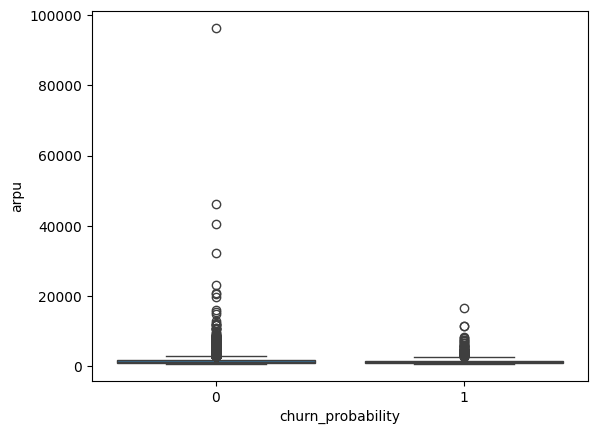

In [210]:
# Create a boxplot to compare ARPU (customer revenue) between churned and non-churned users
# 1. x-axis → churn status (0 = non-churn, 1 = churn)
# 2. y-axis → ARPU (total revenue over 3 months)
# Helps visualize differences in revenue distribution and identify patterns in high-value churn
sns.boxplot(x="churn_probability", y="arpu", data=high_value_cust_df)

Boxplot shows that ARPU distributions for churned and non-churned customers largely overlap, indicating that revenue alone is not a strong predictor of churn. However, extremely high-value customers tend to stay, and the presence of significant outliers suggests the need for transformation or robust modeling techniques

In [211]:
# Define list of date columns to remove (non-numeric → not suitable for correlation)
date_cols_to_drop = ['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8','date_of_last_rech_6',
                     'date_of_last_rech_7', 'date_of_last_rech_8']

# Keep only those date columns that actually exist in the DataFrame
existing_date_cols = [col for col in date_cols_to_drop if col in telecom_eda_df.columns]

# Drop existing date columns to avoid errors in correlation computation
if existing_date_cols:
    telecom_eda_df.drop(columns=existing_date_cols, inplace=True)

# Drop categorical column 'tenure_range' since correlation requires numeric data
if 'tenure_range' in telecom_eda_df.columns:
    telecom_eda_df.drop(columns=['tenure_range'], inplace=True)

# Generate a clustered heatmap (clustermap) of correlations between numerical features
# annot=True → display correlation values
# cmap="RdBu" → red-blue color map (positive vs negative correlation)
# figsize=(600, 600) → extremely large figure for visualizing many features (may be heavy)
sns.clustermap(telecom_eda_df.corr(),annot=True,cmap="RdBu",figsize=(200, 200))

Clustermap reveals strong multicollinearity among groups of features, particularly within usage and recharge-related variables. This suggests redundancy, so I would either aggregate these features or use tree-based models that can handle correlated inputs effectively

In [212]:
# Function to remove highly correlated features based on a threshold
def correlation(dataset, threshold):
    # Set to store names of columns to be removed
    col_corr = set()
    # Compute correlation matrix for the dataset
    corr_matrix = dataset.corr()
    # Iterate through correlation matrix
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            # If correlation between two features is greater than or equal to threshold and the earlier column is not already marked for removal
            if (corr_matrix.iloc[i, j] >= threshold) and (corr_matrix.columns[j] not in col_corr):
                # Select the column name to drop (later column)
                colname = corr_matrix.columns[i]
                # Add it to the set of correlated columns
                col_corr.add(colname)
                # Delete the column from dataset if it exists
                if colname in dataset.columns:
                    del dataset[colname]

In [213]:
# Create a copy of the original telecom dataset to preserve the original data
df_new = telecomDF.copy()

# Apply the correlation function to remove features with correlation ≥ 0.85 this modifies df_new in-place by dropping highly correlated columns
correlation(df_new, 0.85)

# Display the updated dataset after removing correlated features
df_new

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2m_mou_6,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,rchrge2_no_of_days,rchrge1_no_of_days
0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,18.75,0.00,0.0,0.0,65.09,204.99,1.01,0.00,8.20,0.63,0.00,0.38,0.0,0.0,81.21,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.00,0.0,0.0,0.66,0.00,0.0,0.00,1.11,0.69,0.00,3,2,2,65,65,10,65,65,0,0,0,0,0,0,0,0,0,0,0,0,0,1958,0.00,0.00,0.00,0,45.0,18.0
1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,30.73,31.66,0.00,0.0,0.0,0.00,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.01,0.00,0.0,0.00,0.00,0.00,0.00,3,4,5,0,145,50,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,710,0.00,0.00,0.00,0,47.0,28.0
2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,28.94,0.00,0.0,0.0,28.94,84.99,0.00,0.00,2.89,1.38,0.00,0.00,0.0,0.0,56.49,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.25,2,4,2,70,70,0,70,50,0,0,0,0,0,0,0,0,0,0,0,0,0,882,0.00,0.00,0.00,0,33.0,41.0
3,156.362,205.260,111.095,7.26,16.01,0.00,68.76,78.48,50.23,0.00,0.0,0.0,0.00,0.0,1.63,6.99,3.94,0.00,37.91,44.89,23.63,0.00,0.00,0.00,0.00,0.00,8.03,44.91,48.84,23.63,15.33,0.56,0.0,0.0,16.16,37.99,4.60,0.00,14.95,9.13,25.61,0.00,0.0,0.0,76.03,24.98,4.84,23.88,53.99,44.23,57.14,7.23,0.81,0.00,86.21,49.89,81.03,0.00,0.00,0.00,8.89,0.28,2.81,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,2,4,3,110,110,50,110,110,50,0,0,0,0,0,0,0,0,0,0,0,0,982,0.00,0.00,0.00,0,35.0,36.0
4,240.708,128.191,101.565,21.28,4.83,6.13,56.99,38.11,9.63,53.64,0.0,0.0,15.73,0.0,0.00,10.16,4.83,6.13,36.74,19.88,4.61,11.99,1.23,5.01,0.00,9.85,0.00,58.91,25.94,15.76,4.35,0.00,0.0,0.0,4.35,0.00,0.00,0.00,0.00,17.00,0.00,0.00,0.0,0.0,63.26,5.44,1.39,2.66,10.58,4.33,19.49,5.51,3.63,6.14,21.54,9.36,28.31,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,13,10,8,50,41,30,25,10,30,0,0,0,7,6,6,0,0,0,0,1,0,647,0.00,0.00,0.00,0,35.0,31.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [214]:
# Create a copy of the dataset after feature selection (to keep original df_new unchanged)
feature_telecom = df_new.copy()

# Separate target variable (y) from features
# 1. pop() removes 'churn_probability' from the DataFrame and returns it
y = feature_telecom.pop('churn_probability')

# Remaining columns are independent variables (features)
X = feature_telecom

# Split the dataset into training and testing sets
# 1. stratify=y → ensures same proportion of churn/non-churn in both sets (handles class imbalance)
# 2. random_state=42 → ensures reproducibility of the split
X_train, X_test, y_train, y_test = train_test_split(X, y,stratify=y,random_state=42)

In [215]:
# Import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier

# Create placeholder feature names (not actually used later) generates names like "feature 0", "feature 1", ...
best_feature_names = [f"feature {i}" for i in range(X.shape[1])]

# Initialize Random Forest model with fixed random state for reproducibility
random_forest = RandomForestClassifier(random_state=0)

# Check number of missing values in each feature of training data helps understand data quality before model training
missing_values = X_train.isnull().sum()

# Drop rows with missing values from training data ensures model receives clean data (RandomForest cannot handle NaNs directly)
X_train_no_missing = X_train.dropna()

# Align target variable with filtered training data ensures labels correspond to remaining rows after dropping NaNs
y_train_no_missing = y_train.loc[X_train_no_missing.index]

# Train the Random Forest model on cleaned training data
random_forest.fit(X_train_no_missing, y_train_no_missing)

RandomForestClassifier(random_state=0)

,0
count,102.000000
mean,0.009804
std,0.011843
min,0.000112
25%,0.002850
50%,0.007135
75%,0.011098
max,0.082461


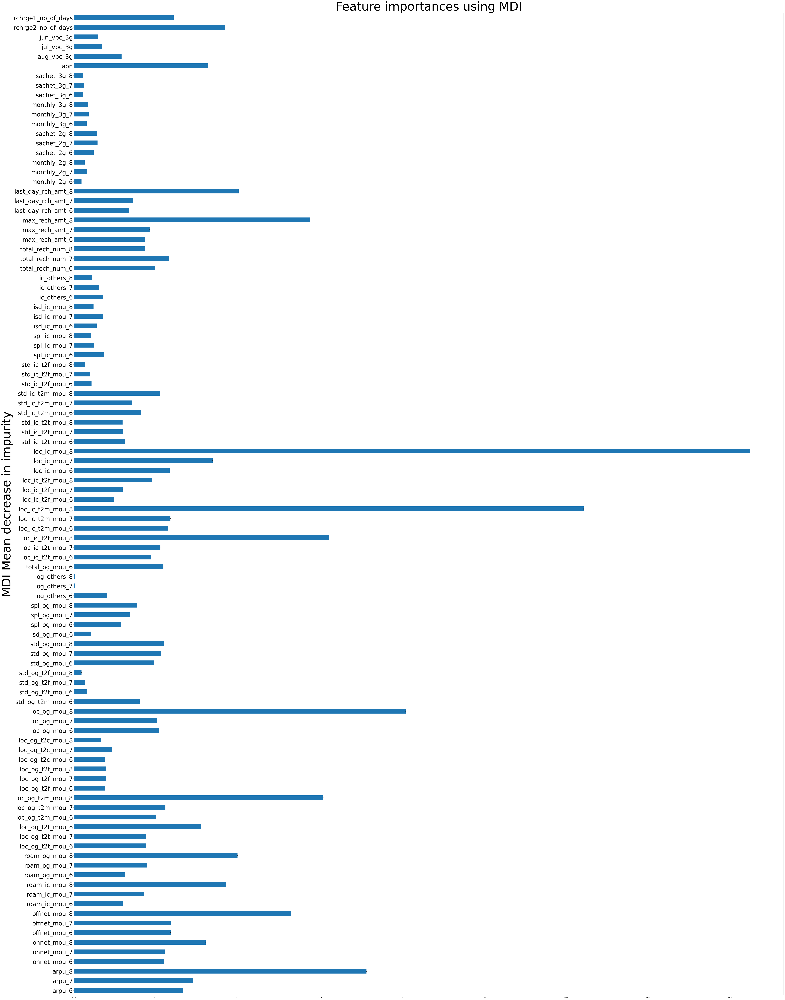

In [216]:
# Extract feature importances from the trained Random Forest model (Mean Decrease in Impurity - MDI)
importances = random_forest.feature_importances_

# Compute standard deviation of feature importances across all trees this shows variability/uncertainty in importance estimates
std = np.std([tree.feature_importances_ for tree in random_forest.estimators_],axis=0)

# Create a Pandas Series with feature names as index helps in easy plotting and interpretation
forest_importances = pd.Series(importances, index=X_train.columns)

# Create a large figure for better visualization (many features)
fig, ax = plt.subplots(figsize=(55,70))

# Plot horizontal bar chart of feature importances
# 1. yerr=std → error bars showing variability across trees
forest_importances.plot.barh(yerr=std, ax=ax)

# Set plot title and labels with large font for readability
ax.set_title("Feature importances using MDI", fontsize=60)
ax.set_ylabel("MDI Mean decrease in impurity", fontsize=60)

# Increase y-axis label size for better visibility
ax.tick_params(axis='y', labelsize=30)

# Adjust layout to prevent overlapping
fig.tight_layout()

# Display summary statistics of feature importances
forest_importances.describe()

Feature importance plot shows that recent usage features, especially from month 8, are the strongest predictors of churn. Recharge behavior and usage trends are also highly influential, while revenue-based features like ARPU are less dominant. This indicates that churn is primarily driven by declining engagement rather than absolute customer value.

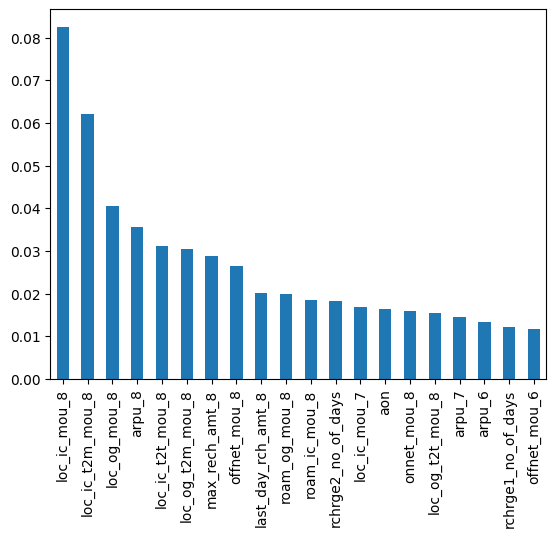

In [217]:
# Select the top 20 most important features based on Random Forest importance scores
# 1. sort_values(ascending=False) → sorts features from highest to lowest importance
# 2. head(20) → keeps only the top 20 features
top_features = forest_importances.sort_values(ascending=False).head(20)
top_features.plot(kind='bar')
plt.show()

In [218]:
# Convert the feature importance Series into a DataFrame this makes it easier to manipulate, filter, and analyze
feature_imp_df = pd.DataFrame(forest_importances)

# Reset index so that feature names (previously index) become a column
feature_imp_df.reset_index(inplace=True)

# Rename columns for clarity 'index' → 'features', and importance values → 'importance'
feature_imp_df.columns = ['features', "importance"]

# Count how many features have importance greater than 0.01 helps identify number of meaningful/high-impact features
len(feature_imp_df[feature_imp_df['importance'] > 0.01])

35

In [219]:
# Filter the feature importance DataFrame to keep only features with importance greater than 0.01 (removes low-impact/noisy features)
feature_imp_df = feature_imp_df[feature_imp_df['importance'] > 0.01]

# Extract the list of important feature names
imp_columns = list(feature_imp_df.features)

# Add the target variable 'churn_probability' to the list this is useful when creating a final dataset for modeling
imp_columns.append('churn_probability')

# Display the final list of selected important columns
imp_columns

['arpu_6',
 'arpu_7',
 'arpu_8',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_ic_mou_8',
 'roam_og_mou_8',
 'loc_og_t2t_mou_8',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'std_og_mou_7',
 'std_og_mou_8',
 'total_og_mou_6',
 'loc_ic_t2t_mou_7',
 'loc_ic_t2t_mou_8',
 'loc_ic_t2m_mou_6',
 'loc_ic_t2m_mou_7',
 'loc_ic_t2m_mou_8',
 'loc_ic_mou_6',
 'loc_ic_mou_7',
 'loc_ic_mou_8',
 'std_ic_t2m_mou_8',
 'total_rech_num_7',
 'max_rech_amt_8',
 'last_day_rch_amt_8',
 'aon',
 'rchrge2_no_of_days',
 'rchrge1_no_of_days',
 'churn_probability']

In [220]:
# Create a new DataFrame using only the selected important columns (features + target)
# imp_columns contains top features based on importance + 'churn_probability'
telecom_imp_feautures_df = df_new[imp_columns]

# Drop rows with missing values to ensure clean data for modeling this avoids errors during training and improves model reliability
telecom_imp_feautures_df = telecom_imp_feautures_df.dropna()

In [221]:
# Display the first 5 rows of the refined dataset containing only important features helps quickly verify:
# - 1. Correct columns are selected
# - 2. Data looks clean after dropping missing values
# - 3. Feature values appear reasonable before modeling
telecom_imp_feautures_df.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_mou_7,std_og_mou_8,total_og_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2m_mou_8,total_rech_num_7,max_rech_amt_8,last_day_rch_amt_8,aon,rchrge2_no_of_days,rchrge1_no_of_days,churn_probability
0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.0,0.00,0.28,16.04,2.33,7.53,16.04,2.61,204.99,1.01,81.21,3.68,7.79,0.83,21.08,16.91,3.26,24.76,24.71,14.96,2,10,0,1958,45.0,18.0,0
1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,19.09,10.53,1.41,18.68,11.09,3.44,39.44,25.03,0.00,4,50,0,710,47.0,28.0,0
2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.0,0.00,0.00,0.00,0.00,24.64,12.98,0.00,84.99,0.00,56.49,6.16,6.49,89.86,25.18,23.51,94.38,31.34,30.01,6.38,4,0,0,882,33.0,41.0,0
3,156.362,205.260,111.095,7.26,16.01,0.00,68.76,78.48,50.23,0.0,1.63,0.00,44.89,23.63,44.91,48.84,23.63,37.99,4.60,76.03,4.84,23.88,53.99,44.23,57.14,86.21,49.89,81.03,2.81,4,50,50,982,35.0,36.0,0
4,240.708,128.191,101.565,21.28,4.83,6.13,56.99,38.11,9.63,0.0,0.00,6.13,19.88,4.61,58.91,25.94,15.76,0.00,0.00,63.26,1.39,2.66,10.58,4.33,19.49,21.54,9.36,28.31,0.00,10,30,30,647,35.0,31.0,0


In [222]:
# Separate target variable (churn_probability) from the dataset
# 1. pop() removes the column from the DataFrame and returns it as y
y = telecom_imp_feautures_df.pop('churn_probability')

# Remaining columns are features (independent variables)
X = telecom_imp_feautures_df

# Split the dataset into training (80%) and testing (20%) sets
# 1. train_size=0.8 → 80% data for training
# 2. test_size=0.2 → 20% data for testing
# 3. random_state=100 → ensures reproducibility of the split
X_train, X_test, y_train, y_test = train_test_split(X, y,train_size=0.8,test_size=0.2,random_state=100)

In [223]:
# Initialize StandardScaler for feature scaling (standardization) this will transform features to have mean = 0 and standard deviation = 1
scaler = StandardScaler()

In [224]:
# Fit the scaler on training data and transform it fit_transform() computes mean & std from X_train and scales the data
X_train_scaled = scaler.fit_transform(X_train)

# Convert the scaled NumPy array back into a DataFrame
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns)

# Check statistical summary of scaled data
# After scaling:
# - Mean should be ~0
# - Standard deviation should be ~1
# this verifies that scaling was applied correctly
X_train_scaled_df.describe()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_mou_7,std_og_mou_8,total_og_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2m_mou_8,total_rech_num_7,max_rech_amt_8,last_day_rch_amt_8,aon,rchrge2_no_of_days,rchrge1_no_of_days
count,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04,5.275600e+04
mean,-1.775145e-16,-4.915992e-17,7.407660e-18,7.643358e-17,9.535679e-17,1.162329e-16,7.003606e-17,2.963064e-18,3.905857e-18,-3.340181e-17,3.151623e-17,-1.589280e-17,7.946399e-18,2.215564e-17,-7.542345e-18,4.848650e-18,6.761173e-17,-2.080879e-17,1.649888e-17,-6.276308e-17,-3.986668e-17,2.693695e-17,6.626488e-17,-3.272839e-17,6.417727e-17,-2.747568e-17,2.071451e-16,-1.319910e-17,2.666758e-17,5.360452e-17,-3.316611e-17,-4.208898e-17,-6.680362e-17,1.569077e-17,-2.094347e-16
std,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00,1.000009e+00
min,-1.328250e+00,-2.557460e+00,-1.740193e+00,-4.396731e-01,-4.275151e-01,-4.218747e-01,-6.181667e-01,-6.083452e-01,-6.008761e-01,-1.272489e-01,-1.485869e-01,-3.044277e-01,-5.910493e-01,-5.926723e-01,-5.696902e-01,-5.726235e-01,-5.762194e-01,-4.267537e-01,-4.185602e-01,-6.703450e-01,-3.218016e-01,-3.295382e-01,-6.344326e-01,-6.465508e-01,-6.398247e-01,-6.607597e-01,-6.533757e-01,-6.582936e-01,-2.510615e-01,-9.908198e-01,-8.999552e-01,-6.321863e-01,-1.100885e+00,-4.122242e+00,-4.353350e+00
25%,-5.677282e-01,-5.442519e-01,-5.392123e-01,-4.190589e-01,-4.080632e-01,-4.048459e-01,-5.205001e-01,-5.146454e-01,-5.137943e-01,-1.272489e-01,-1.485869e-01,-2.962910e-01,-5.306882e-01,-5.380086e-01,-5.111321e-01,-5.062936e-01,-5.140898e-01,-4.267537e-01,-4.185602e-01,-5.676904e-01,-3.020771e-01,-3.105439e-01,-5.415960e-01,-5.392932e-01,-5.408242e-01,-5.504879e-01,-5.325653e-01,-5.415280e-01,-2.510615e-01,-5.657972e-01,-6.572458e-01,-6.321863e-01,-7.941322e-01,-3.812002e-01,-4.900328e-01
50%,-2.535487e-01,-2.457452e-01,-2.379920e-01,-3.313809e-01,-3.265318e-01,-3.243625e-01,-3.252782e-01,-3.271680e-01,-3.243977e-01,-1.272489e-01,-1.485869e-01,-2.290956e-01,-3.330894e-01,-3.357335e-01,-3.208182e-01,-3.182021e-01,-3.204235e-01,-4.015636e-01,-3.973965e-01,-3.484083e-01,-2.175528e-01,-2.217380e-01,-3.051870e-01,-3.039259e-01,-3.001194e-01,-3.009392e-01,-2.939047e-01,-2.942525e-01,-2.304989e-01,-2.824488e-01,-9.092399e-02,-3.389754e-01,-3.644685e-01,3.447119e-02,-6.077540e-02
75%,2.648531e-01,2.465141e-01,2.520180e-01,-4.694423e-02,-6.036732e-02,-6.216644e-02,1.067554e-01,9.727286e-02,1.060221e-01,-1.272489e-01,-1.485869e-01,-3.890065e-02,1.127695e-01,1.229049e-01,9.979449e-02,9.841795e-02,1.099301e-01,-6.624773e-02,-7.570146e-02,1.509025e-01,-1.556233e-02,-8.547373e-03,1.540207e-01,1.513988e-01,1.629155e-01,1.707595e-01,1.582066e-01,1.672903e-01,-7.398135e-02,2.842480e-01,2.731400e-01,6.383945e-01,6.282753e-01,4.501426e-01,5.115678e-01
max,8.151150e+01,9.791789e+01,9.116372e+01,2.457098e+01,2.575810e+01,3.175670e+01,2.600689e+01,2.035578e+01,4.321321e+01,7.644245e+01,8.400050e+01,6.587770e+01,2.92

In [225]:
# Apply the previously fitted scaler (from training data) to test data
X_test_scaled = scaler.transform(X_test)

# Convert scaled test data back to DataFrame for better readability and consistency
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# Check statistical summary of scaled test data
X_test_scaled_df.describe()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_mou_7,std_og_mou_8,total_og_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2m_mou_8,total_rech_num_7,max_rech_amt_8,last_day_rch_amt_8,aon,rchrge2_no_of_days,rchrge1_no_of_days
count,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000,13189.000000
mean,0.012988,-0.004056,-0.007281,0.019453,0.010314,-0.000810,0.005427,0.005766,0.007191,-0.001848,0.015510,0.002510,0.001153,-0.015165,0.006487,0.003957,-0.007842,0.009803,0.008024,0.014044,0.001000,-0.003773,0.006619,0.006039,0.001819,0.009213,0.006436,0.001288,-0.006403,-0.001614,0.006353,-0.005013,-0.002867,0.034251,-0.036680
std,0.933144,0.880216,0.875213,1.061379,1.011735,1.013716,1.014938,1.005780,1.010903,0.896069,1.079008,1.182656,1.030027,0.981952,1.094955,1.047098,1.068983,0.987091,0.987531,1.043798,0.961047,0.939428,1.061357,1.079541,1.004497,1.058439,1.029622,0.987069,0.914917,1.010374,0.999254,0.960673,1.003733,0.990107,0.992804
min,-3.258372,-1.255332,-0.914033,-0.439673,-0.427515,-0.421875,-0.618167,-0.608345,-0.600876,-0.127249,-0.148587,-0.304428,-0.591049,-0.592672,-0.569690,-0.572623,-0.576219,-0.426754,-0.418560,-0.670345,-0.321802,-0.329538,-0.634433,-0.646551,-0.639825,-0.660760,-0.653376,-0.658294,-0.251062,-0.990820,-0.899955,-0.632186,-1.100885,-4.122242,-4.353350
25%,-0.566487,-0.540362,-0.536773,-0.418381,-0.408641,-0.404007,-0.517587,-0.509404,-0.511323,-0.127249,-0.148587,-0.296427,-0.530098,-0.538535,-0.509753,-0.505802,-0.516918,-0.426754,-0.418560,-0.566829,-0.301603,-0.311607,-0.542730,-0.540883,-0.540283,-0.551286,-0.533552,-0.543171,-0.251062,-0.565797,-0.657246,-0.632186,-0.797284,-0.381200,-0.490033
50%,-0.244343,-0.243085,-0.246556,-0.329347,-0.324124,-0.322282,-0.326074,-0.325208,-0.323147,-0.127249,-0.148587,-0.229774,-0.331910,-0.342180,-0.313884,-0.316809,-0.326453,-0.401344,-0.395693,-0.348408,-0.216197,-0.220179,-0.305308,-0.303926,-0.305472,-0.298555,-0.292287,-0.296897,-0.228564,-0.282449,-0.090924,-0.338975,-0.376024,0.034471,-0.060775
75%,0.282226,0.244362,0.247380,-0.040748,-0.046886,-0.055724,0.124514,0.103742,0.098343,-0.127249,-0.148587,-0.039782,0.097302,0.093945,0.086615,0.088176,0.083793,-0.038695,-0.057638,0.173283,-0.006005,-0.006279,0.145945,0.155985,0.147127,0.159020,0.146751,0.153897,-0.070353,0.284248,0.265050,0.638394,0.616720,0.450143,0.368482
max,14.653498,18.086555,23.850611,21.460651,20.027638,34.256667,20.754861,21.301025,22.734193,53.094604,46.204175,72.604025,16.631111,21.392762,42.592099,25.729012,45.334436,15.412391,16.693224,22.310739,33.032120,29.106366,19.322699,26.600958,16.837315,18.428356,20.297451,16.092766,36.625040,15.868411,16.890640,19.892581,3.249329,4.052628,4.088713


In [226]:
!pip install statsmodels

In [227]:
# Import statsmodels for Generalized Linear Models
import statsmodels.api as sm

# Get list of feature names from scaled training DataFrame
model_columns = list(X_train_scaled_df.columns)

# Add 'const' to represent the intercept term in the model this aligns with statsmodels output naming
model_columns = ['const'] + model_columns

# Build a Generalized Linear Model (GLM) with Binomial family (Logistic Regression)
# 1. sm.add_constant() → adds intercept term to feature matrix
# 2. y_train → target variable (churn)
# 3. X_train_scaled → scaled features
logm1 = sm.GLM(y_train,sm.add_constant(X_train_scaled),family=sm.families.Binomial())

# Fit the model and display summary
# 1. xname=model_columns → assigns proper feature names to coefficients in output
logm1.fit().summary(xname=model_columns)

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                52756
Model:                            GLM   Df Residuals:                    52720
Model Family:                Binomial   Df Model:                           35
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11163.
Date:                Fri, 03 Apr 2026   Deviance:                       22325.
Time:                        21:47:33   Pearson chi2:                 1.04e+12
No. Iterations:                     9   Pseudo R-squ. (CS):             0.1389
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -4.1641      0.052    -80.773      0.000      -4.265      -4.063
arpu_6                 0.3017      0.046      6.569      0.000       0.212       0.392
arpu_7                 0.2827      0.054      5.215      0.000       0.176       0.389
arpu_8                -0.6659      0.084     -7.961      0.000      -0.830      -0.502
onnet_mou_6            0.1879      0.079      2.386      0.017       0.034       0.342
onnet_mou_7            0.4103      0.108      3.786      0.000       0.198       0.623
onnet_mou_8           -1.9161      0.614     -3.120      0.002      -3.120      -0.712
offnet_mou_6           0.1668      0.084      1.980      0.048       0.002       0.332
offnet_mou_7           0.4513      0.110      4.097      0.000       0.235       0.667
offnet_mou_8          -2.0171      0.632     -3.194      0.001      -3.255      -0.779
roam_ic_mou_8          0.0347      0.014      2.474      0.013       0.007       0.062
roam_og_mou_8          0.5477      0.124      4.425      0.000       0.305       0.790
loc_og_t2t_mou_8      -0.1385      0.610     -0.227      0.820      -1.334       1.057
loc_og_t2m_mou_7      -0.0535      0.078     -0.689      0.491      -0.206       0.099
loc_og_t2m_mou_8      -0.3063      0.644     -0.475      0.634      -1.569       0.956
loc_og_mou_6          -0.0485      0.044     -1.105      0.269      -0.134       0.037
loc_og_mou_7          -0.2650      0.117     -2.263      0.024      -0.495      -0.035
loc_og_mou_8           1.4637      1.101      1.329      0.184      -0.695       3.622
std_og_mou_7          -0.4625      0.130     -3.554      0.000      -0.718      -0.207
std_og_mou_8           2.3357      0.805      2.902      0.004       0.758       3.913
total_og_mou_6        -0.1866      0.112     -1.664      0.096      -0.407       0.033
loc_ic_t2t_mou_7      -0.0093      0.172     -0.054      0.957      -0.346       0.328
loc_ic_t2t_mou_8       2.1646      0.477      4.535      0.000       1.229       3.100
loc_ic_t2m_mou_6      -0.0041      0.055     -0.074      0.941      -0.112       0.104
loc_ic_t2m_mou_7      -0.0672      0.198     -0.340      0.734      -0.455       0.320
loc_ic_t2m_mou_8       1.4139      0.567      2.492      0.013       0.302       2.526
loc_ic_mou_6           0.0902      0.055      1.647      0.100      -0.017       0.198
loc_ic_mou_7           0.4597      0.287      1.601      0.109      -0.103       1.023
loc_ic_mou_8          -5.8123      0.808     -7.196      0.000      -7.396      -4.229
std_ic_t2m_mou_8      -0.2566      0.055     -4.661      0.000      -0.364      -0.149
total_rech_num_7      -0.1584      0.026     -6.115      0.000      -0.209      -0.108
max_rech_amt_8        -0.1196      0.037     -3.259      0.001      -0.192      -0.048
last_day_rch_amt_8    -0.5832      0.0

Model shows that recent behavioral features, especially month 8 usage and recharge activity, are the strongest predictors of churn. A significant drop in engagement signals churn risk. Revenue alone is not sufficient; instead, changes in behavior over time are the key drivers

In [228]:
# Initialize a Logistic Regression model this model will be used for binary classification (churn vs non-churn) it models the probability of churn
# using a sigmoid (logistic) function
log_reg = LogisticRegression()

In [229]:
# Import Recursive Feature Elimination (RFE)
from sklearn.feature_selection import RFE

# Initialize Recursive Feature Elimination (RFE) with Logistic Regression as the base model
# - n_features_to_select=15 → select top 15 most important features
rfe = RFE(log_reg, n_features_to_select=15)

# Fit RFE on scaled training data
# 1. RFE will recursively remove less important features based on model coefficients and retain only the most relevant 15 features
rfe = rfe.fit(X_train_scaled, y_train)

In [230]:
# Extract names of features selected by RFE
# 1. rfe.support_ → boolean mask (True for selected features, False for eliminated)
rfe_cols = X_train_scaled_df.columns[rfe.support_]

# Display the boolean mask indicating selected vs rejected features
# 1. True → feature selected
# 2. False → feature eliminated
rfe.support_

array([ True, False,  True, False,  True,  True, False,  True,  True,
       False,  True, False, False, False, False,  True, False,  True,
        True, False,  True, False, False,  True,  True, False, False,
        True, False, False, False,  True, False, False, False])

In [231]:
# Combine feature names, selection status, and ranking into a single list of tuples
# 1. X_train_scaled_df.columns → feature names
# 2. rfe.support_ → boolean (True = selected, False = not selected)
# 3. rfe.ranking_ → ranking of features (1 = most important/selected, higher = less important)
list(zip(X_train_scaled_df.columns, rfe.support_, rfe.ranking_))

[('arpu_6', np.True_, np.int64(1)),
 ('arpu_7', np.False_, np.int64(9)),
 ('arpu_8', np.True_, np.int64(1)),
 ('onnet_mou_6', np.False_, np.int64(6)),
 ('onnet_mou_7', np.True_, np.int64(1)),
 ('onnet_mou_8', np.True_, np.int64(1)),
 ('offnet_mou_6', np.False_, np.int64(8)),
 ('offnet_mou_7', np.True_, np.int64(1)),
 ('offnet_mou_8', np.True_, np.int64(1)),
 ('roam_ic_mou_8', np.False_, np.int64(18)),
 ('roam_og_mou_8', np.True_, np.int64(1)),
 ('loc_og_t2t_mou_8', np.False_, np.int64(5)),
 ('loc_og_t2m_mou_7', np.False_, np.int64(20)),
 ('loc_og_t2m_mou_8', np.False_, np.int64(19)),
 ('loc_og_mou_6', np.False_, np.int64(17)),
 ('loc_og_mou_7', np.True_, np.int64(1)),
 ('loc_og_mou_8', np.False_, np.int64(15)),
 ('std_og_mou_7', np.True_, np.int64(1)),
 ('std_og_mou_8', np.True_, np.int64(1)),
 ('total_og_mou_6', np.False_, np.int64(7)),
 ('loc_ic_t2t_mou_7', np.True_, np.int64(1)),
 ('loc_ic_t2t_mou_8', np.False_, np.int64(13)),
 ('loc_ic_t2m_mou_6', np.False_, np.int64(21)),
 ('loc_i

In [232]:
# Convert selected RFE columns into a list (ensures proper indexing)
rfe_cols = list(rfe_cols)

# Scale only the selected RFE features from training data
# 1. fit_transform() computes scaling parameters and applies transformation
X_train_rfe = scaler.fit_transform(X_train[rfe_cols])

# Create list of feature names including 'const' for intercept term (used in statsmodels)
features = ['const'] + list(rfe_cols)

# Display feature names (including intercept)
features

['const',
 'arpu_6',
 'arpu_8',
 'onnet_mou_7',
 'onnet_mou_8',
 'offnet_mou_7',
 'offnet_mou_8',
 'roam_og_mou_8',
 'loc_og_mou_7',
 'std_og_mou_7',
 'std_og_mou_8',
 'loc_ic_t2t_mou_7',
 'loc_ic_t2m_mou_7',
 'loc_ic_t2m_mou_8',
 'loc_ic_mou_8',
 'last_day_rch_amt_8']

In [233]:
# Add constant (intercept term) to the RFE-selected and scaled training features required for statsmodels to include bias term in the model
X_train_sm = sm.add_constant(X_train_rfe)

# Build a Generalized Linear Model (Logistic Regression) using Binomial family for binary classification (churn prediction)
logm2 = sm.GLM(y_train, X_train_sm, family=sm.families.Binomial())

# Fit the model
res = logm2.fit()

# Display model summary with feature names (including 'const')
res.summary(xname=features)

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                52756
Model:                            GLM   Df Residuals:                    52740
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11446.
Date:                Fri, 03 Apr 2026   Deviance:                       22891.
Time:                        21:48:03   Pearson chi2:                 1.19e+12
No. Iterations:                     9   Pseudo R-squ. (CS):             0.1296
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -4.1599      0.051    -81.677      0.000      -4.260      -4.060
arpu_6                 0.4824      0.026     18.555      0.000       0.431       0.533
arpu_8                -0.8790      0.066    -13.371      0.000      -1.008      -0.750
onnet_mou_7            0.6076      0.091      6.680      0.000       0.429       0.786
onnet_mou_8           -0.6277      0.131     -4.778      0.000      -0.885      -0.370
offnet_mou_7           0.6253      0.091      6.846      0.000       0.446       0.804
offnet_mou_8          -0.7308      0.132     -5.527      0.000      -0.990      -0.472
roam_og_mou_8          0.3259      0.029     11.256      0.000       0.269       0.383
loc_og_mou_7          -0.3432      0.084     -4.098      0.000      -0.507      -0.179
std_og_mou_7          -0.5979      0.115     -5.193      0.000      -0.824      -0.372
std_og_mou_8           0.6594      0.169      3.912      0.000       0.329       0.990
loc_ic_t2t_mou_7       0.3481      0.041      8.424      0.000       0.267       0.429
loc_ic_t2m_mou_7       0.2823      0.048      5.899      0.000       0.189       0.376
loc_ic_t2m_mou_8      -1.0430      0.206     -5.069      0.000      -1.446      -0.640
loc_ic_mou_8          -2.5787      0.216    -11.953      0.000      -3.002      -2.156
last_day_rch_amt_8    -0.5725      0.040    -14.242      0.000      -0.651      -0.494
======================================================================================
"""

Final model shows that churn is primarily driven by recent behavioral changes, especially a decline in usage and recharge activity. Features from month 8 dominate, indicating that recency is the strongest predictor. The model is statistically robust with all significant features and provides actionable business insights

In [234]:
# Import VIF from statsmodels
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Create an empty DataFrame to store VIF results
vif = pd.DataFrame()

# Convert scaled RFE-selected features into a DataFrame with column names
# This ensures compatibility with VIF calculation
X_train_vif = pd.DataFrame(X_train_rfe, columns=rfe_cols)

# Add feature names to VIF DataFrame
vif['Features'] = rfe_cols

# Calculate Variance Inflation Factor (VIF) for each feature
# VIF measures multicollinearity (how much a feature is correlated with others)
# Higher VIF → more redundancy
vif['VIF'] = [
    variance_inflation_factor(X_train_vif[rfe_cols].values, i)
    for i in range(X_train_vif[rfe_cols].shape[1])
]

# Round VIF values for better readability
vif['VIF'] = round(vif['VIF'], 2)

# Sort features by VIF in descending order (highest multicollinearity first)
vif = vif.sort_values(by="VIF", ascending=False)

# Display the VIF table
vif

,Features,VIF
8,std_og_mou_7,58.21
4,offnet_mou_7,36.64
2,onnet_mou_7,35.85
7,loc_og_mou_7,21.95
9,std_og_mou_8,14.39
5,offnet_mou_8,8.97
3,onnet_mou_8,8.49
13,loc_ic_mou_8,7.21
12,loc_ic_t2m_mou_8,6.65
1,arpu_8,3.29


VIF analysis shows severe multicollinearity among call usage features, especially in month 7. This indicates redundancy, as these variables capture similar behavioral signals. I would address this by removing or aggregating correlated features to improve model stability and interpretability

In [235]:
# Remove the feature 'loc_ic_mou_8' from the list of selected RFE features this is typically done to reduce multicollinearity (high VIF) or remove redundancy
rfe_cols.remove('loc_ic_mou_8')

In [236]:
# Scale the training data using only the updated RFE-selected columns
X_train_rfe = scaler.fit_transform(X_train[rfe_cols])

# Prepare feature names including 'const' for intercept (used in statsmodels)
features = ['const'] + list(rfe_cols)

# -------- VIF Calculation --------
# Create empty DataFrame to store VIF values
vif = pd.DataFrame()

# Convert scaled array back to DataFrame for VIF computation
X_train_vif = pd.DataFrame(X_train_rfe, columns=rfe_cols)

# Store feature names
vif['Features'] = rfe_cols

# Compute VIF for each feature indicates multicollinearity (how much a feature is explained by others)
vif['VIF'] = [variance_inflation_factor(X_train_vif[rfe_cols].values, i) for i in range(X_train_vif[rfe_cols].shape[1])]

# Round VIF values for readability
vif['VIF'] = round(vif['VIF'], 2)

# Sort features by VIF in descending order (highest multicollinearity first)
vif = vif.sort_values(by="VIF", ascending=False)

# Display updated VIF table after feature removal
vif

,Features,VIF
8,std_og_mou_7,58.21
4,offnet_mou_7,36.64
2,onnet_mou_7,35.85
7,loc_og_mou_7,21.95
9,std_og_mou_8,14.26
5,offnet_mou_8,8.90
3,onnet_mou_8,8.38
1,arpu_8,3.28
11,loc_ic_t2m_mou_7,3.14
12,loc_ic_t2m_mou_8,3.11


VIF results show severe multicollinearity among outgoing call features, particularly for month 7. These variables represent similar behavioral signals, so I would either remove redundant features or aggregate them to ensure model stability and interpretability

In [237]:
# Add constant (intercept term) to the RFE-selected and scaled training features this is required for statsmodels to include the bias term in the model
X_train_sm = sm.add_constant(X_train_rfe)

# Build a Generalized Linear Model (GLM) for Logistic Regression
# 1. family=Binomial → suitable for binary classification (churn prediction)
logm3 = sm.GLM(y_train, X_train_sm, family=sm.families.Binomial())

# Fit the model using training data
res = logm3.fit()

# Display model summary with feature names (including intercept 'const') provides coefficients, p-values, z-scores, and confidence intervals
res.summary(xname=features)

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                52756
Model:                            GLM   Df Residuals:                    52741
Model Family:                Binomial   Df Model:                           14
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11562.
Date:                Fri, 03 Apr 2026   Deviance:                       23124.
Time:                        21:48:12   Pearson chi2:                 1.90e+12
No. Iterations:                     9   Pseudo R-squ. (CS):             0.1258
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -4.0958      0.050    -81.948      0.000      -4.194      -3.998
arpu_6                 0.4951      0.026     19.037      0.000       0.444       0.546
arpu_8                -0.9076      0.067    -13.593      0.000      -1.038      -0.777
onnet_mou_7            0.6238      0.090      6.924      0.000       0.447       0.800
onnet_mou_8           -1.0357      0.136     -7.596      0.000      -1.303      -0.769
offnet_mou_7           0.6411      0.090      7.084      0.000       0.464       0.818
offnet_mou_8          -1.1099      0.138     -8.034      0.000      -1.381      -0.839
roam_og_mou_8          0.4090      0.030     13.724      0.000       0.351       0.467
loc_og_mou_7          -0.3069      0.083     -3.704      0.000      -0.469      -0.145
std_og_mou_7          -0.6034      0.114     -5.297      0.000      -0.827      -0.380
std_og_mou_8           1.1649      0.175      6.646      0.000       0.821       1.508
loc_ic_t2t_mou_7       0.0066      0.023      0.283      0.777      -0.039       0.052
loc_ic_t2m_mou_7       0.2965      0.046      6.447      0.000       0.206       0.387
loc_ic_t2m_mou_8      -3.1323      0.115    -27.129      0.000      -3.359      -2.906
last_day_rch_amt_8    -0.5874      0.040    -14.561      0.000      -0.667      -0.508
======================================================================================
"""

Final model shows that churn is primarily driven by a decline in recent engagement, particularly in incoming calls and recharge activity. Month 8 features dominate, confirming that recency is the strongest predictor. The model is statistically robust, with minimal multicollinearity and mostly significant features.

In [238]:
# Re-initialize rfe_cols to its state after the previous VIF analysis (logm3) this ensures consistency if the cell is run multiple times
rfe_cols = ['arpu_6', 'arpu_8', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_7', 'offnet_mou_8',
            'roam_og_mou_8', 'loc_og_mou_7', 'std_og_mou_7', 'std_og_mou_8', 'loc_ic_t2t_mou_7',
            'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8', 'last_day_rch_amt_8']

# Remove the insignificant feature from selected RFE columns this feature had high p-value (not statistically significant)
rfe_cols.remove('loc_ic_t2t_mou_7')

# Recreate scaled training data with updated feature set scaler must be re-fitted because the feature set has changed
X_train_rfe = scaler.fit_transform(X_train[rfe_cols])

# Add constant for statsmodels (intercept term)
X_train_sm = sm.add_constant(X_train_rfe)

# Update feature names list
features = ['const'] + list(rfe_cols)

# Refit GLM model after removing the feature
logm4 = sm.GLM(y_train, X_train_sm, family=sm.families.Binomial())
res = logm4.fit()

# View updated summary
res.summary(xname=features)

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:      churn_probability   No. Observations:                52756
Model:                            GLM   Df Residuals:                    52742
Model Family:                Binomial   Df Model:                           13
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -11562.
Date:                Fri, 03 Apr 2026   Deviance:                       23124.
Time:                        21:48:12   Pearson chi2:                 1.89e+12
No. Iterations:                     9   Pseudo R-squ. (CS):             0.1258
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -4.0954      0.050    -81.978      0.000      -4.193      -3.997
arpu_6                 0.4950      0.026     19.036      0.000       0.444       0.546
arpu_8                -0.9076      0.067    -13.593      0.000      -1.038      -0.777
onnet_mou_7            0.6240      0.090      6.925      0.000       0.447       0.801
onnet_mou_8           -1.0348      0.136     -7.592      0.000      -1.302      -0.768
offnet_mou_7           0.6408      0.090      7.081      0.000       0.463       0.818
offnet_mou_8          -1.1091      0.138     -8.031      0.000      -1.380      -0.838
roam_og_mou_8          0.4088      0.030     13.721      0.000       0.350       0.467
loc_og_mou_7          -0.3053      0.083     -3.692      0.000      -0.467      -0.143
std_og_mou_7          -0.6034      0.114     -5.297      0.000      -0.827      -0.380
std_og_mou_8           1.1637      0.175      6.642      0.000       0.820       1.507
loc_ic_t2m_mou_7       0.2979      0.046      6.520      0.000       0.208       0.387
loc_ic_t2m_mou_8      -3.1323      0.115    -27.131      0.000      -3.359      -2.906
last_day_rch_amt_8    -0.5874      0.040    -14.561      0.000      -0.666      -0.508
======================================================================================
"""

Final model shows that churn is primarily driven by a decline in recent engagement, especially incoming calls and recharge activity. Month 8 features dominate, confirming that recency is the strongest predictor. The model is statistically robust with all significant features and reduced multicollinearity, making it both interpretable and reliable.

In [239]:
# Predict churn probabilities on the training data using the fitted GLM model
# 1. res.predict() returns probability values between 0 and 1 (not class labels)
y_train_pred = res.predict(X_train_sm)

# Display the predicted probabilities for training data
y_train_pred

array([0.00134611, 0.03171751, 0.11811822, ..., 0.14989448, 0.06619902,
       0.07079074])

In [240]:
# Create a DataFrame combining actual labels and predicted probabilities
# 1. 'True_Churn' → actual target values
# 2. 'Churn_Prob' → predicted probability of churn from the model
y_train_pred_final_df = pd.DataFrame({'True_Churn': y_train.values,'Churn_Prob': y_train_pred})

# Convert predicted probabilities into binary class predictions
y_train_pred_final_df['Pred_Churn'] = y_train_pred_final_df['Churn_Prob'].map(lambda x: 1 if x > 0.1 else 0)

In [241]:
# Display the DataFrame containing:
# - 1. True_Churn → actual churn labels
# - 2. Churn_Prob → predicted probabilities from the model
# - 3. Pred_Churn → final predicted class based on chosen threshold (0.1)
# helps visually inspect model predictions and compare with actual values
y_train_pred_final_df

,True_Churn,Churn_Prob,Pred_Churn
0,0,0.001346,0
1,0,0.031718,0
2,1,0.118118,1
3,0,0.095780,0
4,0,0.102743,1
...,...,...,...
52751,0,0.117161,1
52752,0,0.217354,1
52753,0,0.149894,1
52754,0,0.066199,0


In [242]:
# Import metrics module
from sklearn import metrics

# Compute the confusion matrix to evaluate model performance
# 1. True_Churn → actual labels
# 2. Pred_Churn → predicted labels based on threshold (0.1)
confusion_matrix = metrics.confusion_matrix(y_train_pred_final_df.True_Churn,y_train_pred_final_df.Pred_Churn)

# Print the confusion matrix
print(confusion_matrix)

[[36532 11838]
 [  793  3593]]


In [243]:
# Calculate and print accuracy of the model on training data accuracy_score → (TP + TN) / total predictions
# Compares actual labels (True_Churn) with predicted labels (Pred_Churn)
# Gives overall correctness of the model
print("Train data Accuracy :", metrics.accuracy_score(y_train_pred_final_df.True_Churn,y_train_pred_final_df.Pred_Churn))

Train data Accuracy : 0.7605769959814997


In [244]:
# Extract values from confusion matrix for detailed evaluation
# True Positives (TP): correctly predicted churners (actual = 1, predicted = 1)
TP = confusion_matrix[1, 1]

# True Negatives (TN): correctly predicted non-churners (actual = 0, predicted = 0)
TN = confusion_matrix[0, 0]

# False Positives (FP): incorrectly predicted churners (actual = 0, predicted = 1)
# These are customers wrongly flagged as churn risk
FP = confusion_matrix[0, 1]

# False Negatives (FN): missed churners (actual = 1, predicted = 0)
# Most critical error → leads to revenue loss
FN = confusion_matrix[1, 0]

In [245]:
# Calculate and print key classification metrics based on confusion matrix values
# Sensitivity / Recall: Measures how well the model identifies actual churners
# Recall = TP / (TP + FN)
# High recall → fewer missed churners (very important for business)
print("Senstivity/Recall: ", TP / float(TP + FN))

# Specificity: Measures how well the model identifies non-churners
# Specificity = TN / (TN + FP)
print("Specificity: ", TN / float(TN + FP))

# False Positive Rate (FPR): Proportion of non-churners incorrectly classified as churners
# FPR = FP / (TN + FP)
print("FPR: ", FP / float(TN + FP))

# Precision: Measures how many predicted churners are actually churners
# Precision = TP / (TP + FP)
# High precision → fewer false alarms
print("Precision:", TP / float(TP + FP))

Senstivity/Recall:  0.8191974464204287
Specificity:  0.7552615257390944
FPR:  0.24473847426090553
Precision: 0.23284297842006352


Model achieves high recall (82%), meaning it captures most churners, which is critical for business. Although precision is low (23%), this is an expected tradeoff due to the low threshold. In churn prediction, prioritizing recall is more important than precision because missing a churner has a higher cost.

In [246]:
# Define a function to plot the ROC (Receiver Operating Characteristic) curve
# 1. actual → true labels (0 or 1)
# 2. probs → predicted probabilities from the model
def draw_roc_curve(actual, probs):
    # Compute False Positive Rate (FPR), True Positive Rate (TPR), and thresholds drop_intermediate=False → keeps all thresholds for detailed curve
    fpr, tpr, thresholds = metrics.roc_curve(actual, probs, drop_intermediate=False)
    # Calculate AUC (Area Under Curve) measures overall model performance (higher = better)
    auc_score = metrics.roc_auc_score(actual, probs)
    # Create plot
    plt.figure(figsize=(4, 4))
    # Plot ROC curve (TPR vs FPR) shows trade-off between sensitivity and specificity
    plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score)
    # Plot diagonal baseline (random model)
    plt.plot([0, 1], [0, 1], 'k--')
    # Set axis limits
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    # Label axes
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    # Add title
    plt.title('Receiver operating characteristic')
    # Show legend
    plt.legend(loc="lower right")
    # Display plot
    plt.show()
    # Function returns nothing (only visualization)
    return None

In [247]:
# Compute ROC curve values for model evaluation
# 1. fpr → False Positive Rate (FP / (FP + TN))
# 2. tpr → True Positive Rate (Recall = TP / (TP + FN))
# 3. thresholds → different probability cutoffs used to classify predictions
# 4. True_Churn → actual labels
# 5. Churn_Prob → predicted probabilities from the model
# drop_intermediate=False → keeps all threshold values (more detailed curve)
fpr, tpr, thresholds = metrics.roc_curve(y_train_pred_final_df.True_Churn,y_train_pred_final_df.Churn_Prob,drop_intermediate=False)

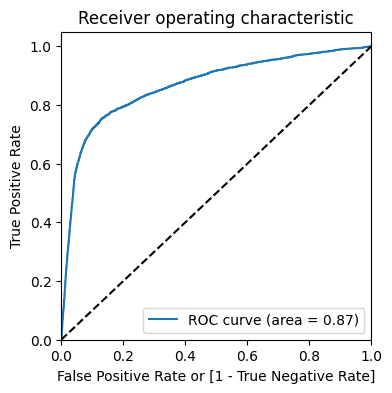

In [248]:
# Plot the ROC curve using actual churn labels and predicted probabilities
# 1. True_Churn → actual labels (ground truth)
# 2. Churn_Prob → predicted probabilities from the model
draw_roc_curve(y_train_pred_final_df.True_Churn,y_train_pred_final_df.Churn_Prob)

ROC curve shows strong model performance with an AUC of 0.87, indicating good separability between churners and non-churners. The curve rises steeply, meaning we can achieve high recall with relatively low false positives. This gives flexibility to choose thresholds based on business needs

In [249]:
# Create a list of threshold values from 0.0 to 0.9 (step = 0.1)
num = [float(x)/10 for x in range(10)]

# For each threshold, generate predicted class labels if predicted probability > threshold → classify as churn (1), else non-churn (0)
for i in num:
    y_train_pred_final_df[i] = y_train_pred_final_df.Churn_Prob.map(lambda x: 1 if x > i else 0)

# Display first few rows of the DataFrame contains:
# - True_Churn → actual labels
# - Churn_Prob → predicted probabilities
# - Multiple columns (0.0, 0.1, ..., 0.9) → predictions at different thresholds
y_train_pred_final_df.head()

,True_Churn,Churn_Prob,Pred_Churn,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.001346,0,1,0,0,0,0,0,0,0,0,0
1,0,0.031718,0,1,0,0,0,0,0,0,0,0,0
2,1,0.118118,1,1,1,0,0,0,0,0,0,0,0
3,0,0.095780,0,1,0,0,0,0,0,0,0,0,0
4,0,0.102743,1,1,1,0,0,0,0,0,0,0,0


In [250]:
# Create an empty DataFrame to store evaluation metrics for different thresholds
cut_off_df = pd.DataFrame(columns=['cut_off', 'accuracy', 'sensitivity', 'specificity'])
from sklearn.metrics import confusion_matrix
# Define threshold values from 0.0 to 0.9
num = [float(x)/10 for x in range(10)]
# Loop through each threshold
for i in num:
    # Compute confusion matrix for current threshold
    c_m1 = metrics.confusion_matrix(y_train_pred_final_df.True_Churn,y_train_pred_final_df[i])
    # Total number of observations
    total1 = sum(sum(c_m1))
    # Calculate accuracy → overall correctness
    accuracy = (c_m1[0,0] + c_m1[1,1]) / total1
    # Calculate specificity → TN / (TN + FP) measures how well non-churners are identified
    speci = c_m1[0,0] / (c_m1[0,0] + c_m1[0,1])
    # Calculate sensitivity (recall) → TP / (TP + FN) measures how well churners are identified
    sensi = c_m1[1,1] / (c_m1[1,0] + c_m1[1,1])
    # Store results in DataFrame for this threshold
    cut_off_df.loc[i] = [i, accuracy, sensi, speci]
# Display the DataFrame containing metrics for all thresholds
cut_off_df

,cut_off,accuracy,sensitivity,specificity
0.0,0.0,0.083137,1.000000,0.000000
0.1,0.1,0.760577,0.819197,0.755262
0.2,0.2,0.903973,0.672595,0.924953
0.3,0.3,0.922814,0.319197,0.977548
0.4,0.4,0.919801,0.150251,0.989580
0.5,0.5,0.918796,0.081623,0.994707
0.6,0.6,0.917810,0.044688,0.996982
0.7,0.7,0.917336,0.024396,0.998305
0.8,0.8,0.917090,0.012084,0.999152
0.9,0.9,0.917014,0.005016,0.999711


Threshold analysis shows a clear trade-off between recall and specificity. While 0.1 maximizes recall (82%), 0.2 provides the best balance with high accuracy (90%) and strong specificity (92%). I would choose the threshold based on business cost, typically prioritizing recall in churn prediction

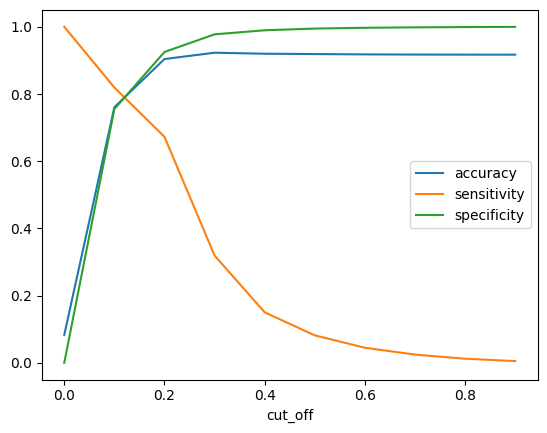

In [251]:
# Plot how accuracy, sensitivity (recall), and specificity vary with different thresholds
# 1. x-axis → cut_off (threshold values from 0.0 to 0.9)
# 2. y-axis → performance metrics:
#   - accuracy → overall correctness
#   - sensitivity → recall (ability to detect churners)
#   - specificity → ability to detect non-churners

# visualize the trade-off between recall and specificity
cut_off_df.plot.line(x='cut_off',y=['accuracy', 'sensitivity', 'specificity'])

# Display the plot
plt.show()

Plot shows the trade-off between sensitivity and specificity across thresholds. As threshold increases, recall drops sharply while specificity improves. The optimal threshold lies around 0.2, where we achieve a good balance between detecting churners and minimizing false positives.

In [252]:
# Create a DataFrame to store actual churn labels and predicted probabilities
# 1. 'True_Churn' → ground truth values from training data
# 2. 'Churn_Prob' → predicted probabilities from the logistic regression model
y_train_pred_final_df = pd.DataFrame({'True_Churn': y_train.values,'Churn_Prob': y_train_pred})

# Convert predicted probabilities into binary class predictions using a threshold of 0.1
# 1. if probability > 0.1 → classify as churn (1), else non-churn (0)
# 2. lower threshold increases recall (captures more churners) but may reduce precision
y_train_pred_final_df['Pred_Churn'] = y_train_pred_final_df['Churn_Prob'].map(lambda x: 1 if x > 0.1 else 0)

In [253]:
# Import evaluation metrics
from sklearn.metrics import precision_score, recall_score, f1_score

# Calculate Precision: Precision = TP / (TP + FP)
# Measures how many predicted churners are actually churners
print("Precision: ", precision_score(y_train_pred_final_df.True_Churn, y_train_pred_final_df.Pred_Churn))

# Calculate Recall: Recall = TP / (TP + FN)
# Measures how many actual churners are correctly identified most important metric in churn prediction
print("Recall: ", recall_score(y_train_pred_final_df.True_Churn, y_train_pred_final_df.Pred_Churn))

# Calculate F1 Score: # F1 = harmonic mean of Precision and Recall
# Balances false positives and false negatives
print("F1 Score: ", f1_score(y_train_pred_final_df.True_Churn, y_train_pred_final_df.Pred_Churn))

Precision:  0.23284297842006352
Recall:  0.8191974464204287
F1 Score:  0.36261795428167737


Model achieves high recall (82%), ensuring most churners are captured, which is critical for business. The low precision (23%) indicates a higher false positive rate, which is an acceptable tradeoff given the relatively low cost of retention campaigns compared to customer loss.

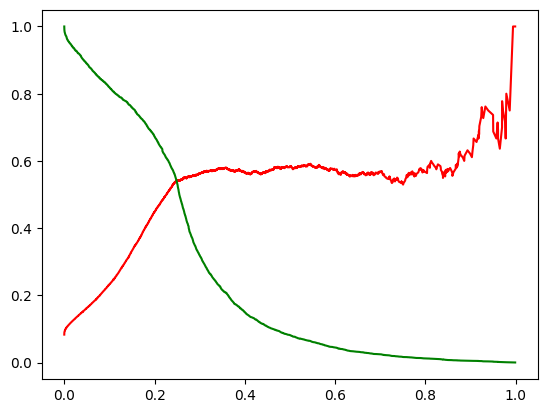

In [254]:
# Import precision_recall_curve for model evaluation
from sklearn.metrics import precision_recall_curve

# Compute Precision-Recall values for different probability thresholds
# 1. p → precision values
# 2. r → recall values
# 3. thresholds → probability cutoffs used for classification
p, r, thresholds = precision_recall_curve(y_train_pred_final_df.True_Churn,y_train_pred_final_df.Churn_Prob)

# Plot Precision vs Threshold (red line) shows how precision changes as threshold increases
plt.plot(thresholds, p[:-1], "r-")

# Plot Recall vs Threshold (green line) shows how recall decreases as threshold increases
plt.plot(thresholds, r[:-1], "g-")

# Display the plot
plt.show()

Precision-recall curve shows a clear trade-off between capturing churners and avoiding false positives. The intersection point around 0.2 provides a balanced threshold, while lower thresholds prioritize recall, which is often preferred in churn prediction

In [255]:
# Scale the test data using the same scaler fitted on training data
# 1. Use transform() only (not fit_transform) to avoid data leakage
# 2. rfe_cols → selected features after RFE + VIF filtering
X_test_scaled = scaler.transform(X_test[rfe_cols])

# Add constant (intercept term) to test data for statsmodels GLM this ensures consistency with training data where intercept was included
X_test_sm = sm.add_constant(X_test_scaled)

In [256]:
# Generate predicted probabilities for the test dataset using the trained GLM model
# 1. res → trained logistic regression (GLM) model
# 2. X_test_sm → scaled test features with added intercept
y_test_pred = res.predict(X_test_sm)

In [257]:
# Create a DataFrame to store test results
# 1. 'Churn_Prob' → predicted probabilities from the model on test data
# 2. 'True_Churn' → actual churn labels from test set
y_pred_final = pd.DataFrame({"Churn_Prob": y_test_pred,"True_Churn": y_test})

# Convert probabilities into binary predictions using threshold = 0.1
# 1. if probability > 0.1 → predict churn (1), else non-churn (0)
# 2. low threshold prioritizes recall (catching more churners)
y_pred_final['Pred_Churn'] = y_pred_final['Churn_Prob'].map(lambda x: 1 if x > 0.1 else 0)

# Display the final prediction DataFrame
y_pred_final

,Churn_Prob,True_Churn,Pred_Churn
24096,0.469655,1,1
45780,0.084171,0,0
25259,0.145426,0,1
22127,0.035150,0,0
48508,0.106759,0,1
...,...,...,...
45561,0.030716,0,0
29448,0.000040,0,0
5852,0.064298,0,0
67007,0.035990,0,0


test predictions show that the model assigns meaningful probabilities, with higher values correctly identifying churners. Using a low threshold (0.1), the model captures most churners but introduces false positives in the mid-probability range. This trade-off is acceptable depending on business priorities

In [258]:
# Compute confusion matrix for test data
# 1. True_Churn → actual labels from test set
# 2. Pred_Churn → predicted labels based on chosen threshold (0.1)
confusion_test = metrics.confusion_matrix(y_pred_final.True_Churn,y_pred_final.Pred_Churn)

# Display the confusion matrix helps evaluate model performance on unseen (test) data
confusion_test

array([[9095, 3035],
       [ 195,  864]])

In [259]:
# Extract individual components from the test confusion matrix
# True Positives (TP): customers who actually churned and were correctly predicted as churn
TP = confusion_test[1, 1]

# True Negatives (TN): customers who did not churn and were correctly predicted as non-churn
TN = confusion_test[0, 0]

# False Positives (FP): customers who did not churn but were incorrectly predicted as churn
# leads to unnecessary retention cost
FP = confusion_test[0, 1]

# False Negatives (FN): customers who actually churned but were predicted as non-churn
# most critical error → leads to revenue loss
FN = confusion_test[1, 0]

In [260]:
# Calculate and print evaluation metrics on test data
# Accuracy: Measures overall correctness of predictions
# Accuracy = (TP + TN) / Total
print("Test Accuracy:",metrics.accuracy_score(y_pred_final.True_Churn,y_pred_final.Pred_Churn))

# Sensitivity (Recall): Measures how well the model identifies actual churners
# Recall = TP / (TP + FN)
print("Senstivity: ",TP / float(TP + FN))

# Specificity:Measures how well the model identifies non-churners
# Specificity = TN / (TN + FP)
print("Specificity: ",TN / float(TN + FP))

Test Accuracy: 0.7550989460914398
Senstivity:  0.8158640226628895
Specificity:  0.7497938994229184


model achieves strong recall (82%) on test data, ensuring most churners are captured, while maintaining reasonable specificity (75%). The consistency between train and test metrics indicates good generalization and no overfitting. This makes the model suitable for real-world deployment

In [261]:
# Fit the scaler on training data and transform it
# 1. fit_transform() → learns mean & std from training data, then scales it
X_train_scaled = scaler.fit_transform(X_train)

# Apply the SAME scaling learned from training data to test data
# 1. transform() → uses training parameters → avoids data leakage
X_test_scaled = scaler.transform(X_test)

# Display the scaled training data as a NumPy array
X_train_scaled

array([[ 2.37167189,  2.24727134,  3.80302712, ...,  0.77639897,
        -0.10408593,  0.08231041],
       [-0.33832081, -0.40288395, -0.51875912, ..., -0.57457296,
         0.45014256,  1.22699689],
       [-0.74479922, -0.61668978, -0.479096  , ..., -0.13020194,
         1.14292817, -0.77620444],
       ...,
       [-0.65977021, -0.00497525, -0.7194406 , ...,  1.1419808 ,
        -1.21254291,  1.3700827 ],
       [-0.47935866, -0.09596064, -0.12076815, ...,  0.17760115,
         0.03447119, -0.20386121],
       [-0.36825872, -0.57506516, -0.66002541, ..., -0.56091617,
         0.72725681, -0.63311863]])

In [262]:
# Import PCA (Principal Component Analysis) for dimensionality reduction
from sklearn.decomposition import PCA

# Initialize PCA (Principal Component Analysis) model random_state ensures reproducibility of results
pca = PCA(random_state=42)

# Fit PCA on scaled training data that capture maximum variance
pca.fit(X_train_scaled)

# Display principal components
# 1. Each row represents a principal component
# 2. Each column represents the contribution (loading/weight) of an original feature
pca.components_

array([[ 2.13735229e-01,  2.19813899e-01,  2.09519210e-01, ...,
         4.63963692e-02, -1.64341425e-02, -1.03137441e-02],
       [ 1.41055976e-01,  1.62827993e-01,  1.47253426e-01, ...,
        -1.00895315e-01,  9.93597235e-03, -3.46952117e-03],
       [-9.29439897e-02, -9.78964625e-02, -1.26942409e-01, ...,
        -8.74677861e-02,  8.16844948e-03, -1.12967892e-02],
       ...,
       [ 5.74247218e-04, -2.15778520e-04, -2.04895194e-03, ...,
        -3.26108086e-04, -5.05720582e-04, -5.56213697e-04],
       [ 1.22212114e-02, -4.54568530e-03,  1.71266291e-02, ...,
         1.50749613e-03, -4.33939180e-04,  5.86269417e-04],
       [ 6.66412894e-03, -4.69777410e-03,  1.25671664e-02, ...,
        -1.82959281e-03,  5.02842834e-04,  7.29958317e-04]])

In [263]:
# Compute cumulative explained variance from PCA
var_cumulative = np.cumsum(pca.explained_variance_ratio_)

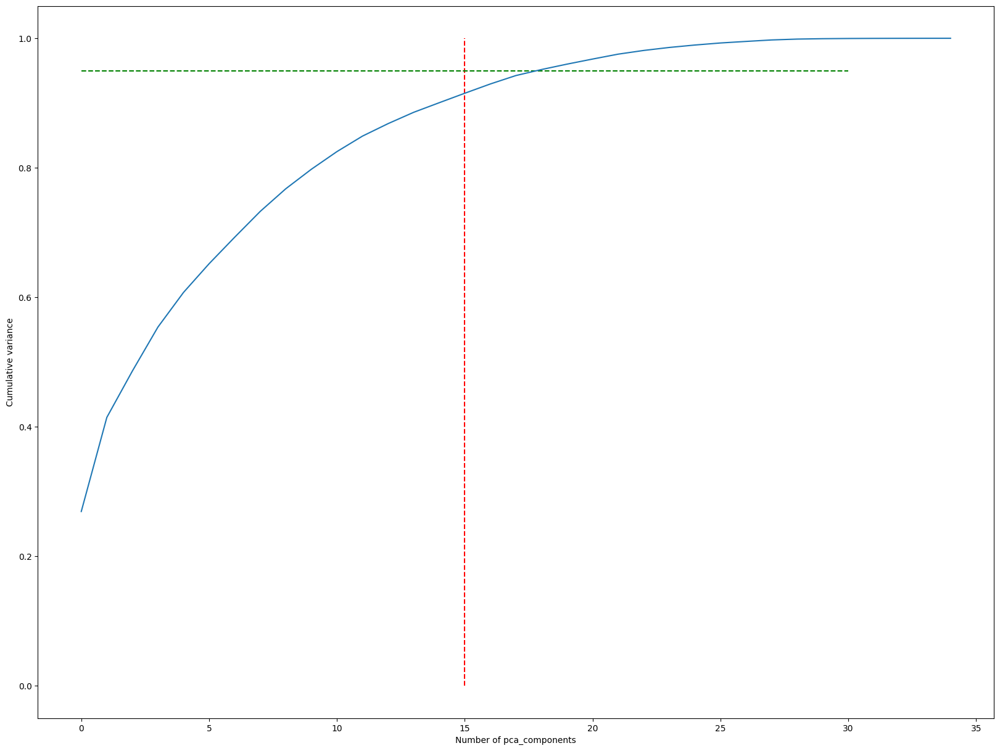

In [264]:
# Create a large figure for better visualization
fig = plt.figure(figsize=[20, 15])

# Draw a vertical reference line at x = 15, indicates chosen number of PCA components
plt.vlines(x=15, ymax=1, ymin=0, colors="r", linestyles="--")

# Draw a horizontal reference line at y = 0.95, indicates target cumulative variance (95%)
plt.hlines(y=0.95, xmax=30, xmin=0, colors="g", linestyles="--")

# Plot cumulative explained variance vs number of components
plt.plot(var_cumulative)

# Label y-axis (how much variance is explained)
plt.ylabel("Cumulative variance")

# Label x-axis (number of PCA components)
plt.xlabel("Number of pca_components")

# Display the plot
plt.show()

PCA curve shows that most variance is captured within the first ~15 components, indicating strong redundancy in the original features. Selecting 15 components provides an optimal balance between dimensionality reduction and information retention.

In [265]:
# Import Incremental PCA for dimensionality reduction
from sklearn.decomposition import IncrementalPCA

# Initialize Incremental PCA with 15 components
# 1. IncrementalPCA is used for large datasets as it processes data in batches
# 2. n_components=15 → reduce data to 15 principal components (based on earlier analysis)
pca_final = IncrementalPCA(n_components=15)

# Check the shape of the scaled training data helps verify dataset size before applying PCA
X_train_scaled.shape

(52756, 35)

In [266]:
# Fit Incremental PCA on training data and transform it learns principal components (directions of maximum variance) reduces original features → 15 components
df_train_pca = pca_final.fit_transform(X_train_scaled)

# Apply the same PCA transformation to test data uses components learned from training data → avoids data leakage
df_test_pca = pca_final.transform(X_test_scaled)

In [267]:
# Scale the test data using the same scaler fitted on training data ensures consistency and prevents data leakage
X_test_scaled = scaler.transform(X_test)

# Apply the trained PCA transformation to the scaled test data uses components learned from training data (pca_final) reduces test data to 15 principal components
df_test_pca_final = pca_final.transform(X_test_scaled)

# Display the transformed test data
df_test_pca_final

array([[-1.65906969,  1.05170954,  0.16862696, ..., -1.13796094,
         1.50918692,  0.08316339],
       [-1.75103463, -1.03286058,  0.30720223, ..., -0.59134293,
        -0.44731364, -0.12177703],
       [-2.46598286, -0.07705392,  0.01962758, ...,  0.66322779,
        -0.87058609,  0.47135406],
       ...,
       [-0.41776898,  1.0924491 ,  0.77274516, ...,  0.05862181,
        -0.84804697, -0.04391479],
       [-0.63704208,  0.92528319, -1.3225644 , ..., -0.34664548,
        -0.21888304,  0.072131  ],
       [-2.97681318, -0.08616928,  0.03305574, ...,  0.07245637,
        -0.55348136,  0.36600918]])

In [268]:
# Used for building an ensemble model that combines multiple weak learners (decision trees) to create a strong predictive model
from sklearn.ensemble import GradientBoostingClassifier
# Initialize Gradient Boosting Classifier random_state ensures reproducibility of results
gb = GradientBoostingClassifier(random_state=42)

# Get all hyperparameters of the model returns a dictionary of default parameter values
# Useful for:
# - Understanding model configuration
# - Hyperparameter tuning
# - Debugging and reproducibility
gb.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'log_loss',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': 42,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

In [269]:
# Train Gradient Boosting model on PCA-transformed training data
# 1. df_train_pca → reduced feature space (15 components)
# 2. y_train → target variable (churn)
gb.fit(df_train_pca, y_train)

# Generate predictions on training data used to evaluate how well the model fits the training set
gb_pred_train = gb.predict(df_train_pca)

# Generate predictions on test data used to evaluate model generalization on unseen data
gb_pred_test = gb.predict(df_test_pca)

In [270]:
# Import metrics for evaluation
from sklearn.metrics import accuracy_score, recall_score

# Evaluate Gradient Boosting model performance on training and test data
# Train Accuracy: Measures how well the model fits the training data
# Accuracy = (TP + TN) / Total
print("Train Accuracy :", accuracy_score(y_train, gb_pred_train))

# Train Sensitivity (Recall): Measures how many actual churners are correctly identified in training data
# Recall = TP / (TP + FN)
print("Train Sensitivity :", recall_score(y_train, gb_pred_train))

# Test Accuracy: Measures overall correctness on unseen data
# Important for evaluating generalization
print("Test Accuracy :", accuracy_score(y_test, gb_pred_test))

# Test Sensitivity (Recall): Measures how well the model detects churners on test data
# Most important metric in churn prediction
print("Test Sensitivity :", recall_score(y_test, gb_pred_test))

Train Accuracy : 0.9303207218136326
Train Sensitivity : 0.28454172366621067
Test Accuracy : 0.9255440139510198
Test Sensitivity : 0.2332389046270066


Although the Gradient Boosting model achieves high accuracy (93%), it performs poorly in terms of recall (23%), meaning it fails to identify most churners. In churn prediction, recall is more critical than accuracy, so the logistic regression model is more suitable despite its lower accuracy

In [271]:
# Add constant (intercept term) to PCA-transformed training data required for statsmodels GLM to include bias term
X_train_sm = sm.add_constant(df_train_pca)

# Convert target variable to DataFrame statsmodels expects structured input
y_train = pd.DataFrame(y_train)

# Initialize GLM (Generalized Linear Model) with Binomial family this is equivalent to Logistic Regression
logm4 = sm.GLM(y_train,X_train_sm,family=sm.families.Binomial())

# Fit the model → learns relationship between PCA components and churn
res = logm4.fit()

# Add constant (intercept) to PCA-transformed test data
X_test_sm = sm.add_constant(df_test_pca)

In [272]:
# Generate predicted probabilities for the test dataset using the trained GLM model
# 1. res → fitted logistic regression (GLM) model
# 2. X_test_sm → PCA-transformed test features with added intercept

# Output:
# 1. y_test_pred contains probability values between 0 and 1
y_test_pred = res.predict(X_test_sm)

In [273]:
# Create a DataFrame to store test predictions
# 1. 'True_Churn' → actual labels from test dataset
# 2. 'Churn_Prob' → predicted probabilities from the PCA + GLM model
y_test_pred_final = pd.DataFrame({'True_Churn': y_test.values,'Churn_Prob': y_test_pred})

# Convert predicted probabilities into binary class predictions
# 1. Using threshold = 0.1
# 2. If probability > 0.1 → classify as churn (1), else non-churn (0) lower threshold increases recall (captures more churners)
y_test_pred_final['Pred_Churn'] = y_test_pred_final['Churn_Prob'].map(lambda x: 1 if x > 0.1 else 0)

In [274]:
# Evaluate PCA + Logistic (GLM) model performance on test data
# Test Accuracy: Measures overall correctness → (TP + TN) / Total
print("Test Accuracy :",metrics.accuracy_score(y_test_pred_final.True_Churn,y_test_pred_final.Pred_Churn))

# Test Sensitivity (Recall): Measures how many actual churners are correctly identified -> Recall = TP / (TP + FN)
print("Test Sensitivity :",metrics.recall_score(y_test_pred_final.True_Churn,y_test_pred_final.Pred_Churn))

Test Accuracy : 0.7616195314277049
Test Sensitivity : 0.8205854579792257


PCA-based logistic regression model achieves a recall of 82%, ensuring most churners are captured, while maintaining reasonable accuracy 76%. Compared to other models, it provides the best balance between performance and business relevance, making it the preferred choice for deployment

In [275]:
# Import XGBoost library provides high-performance gradient boosting algorithms for classification and regression
import xgboost as xgb

# Initialize XGBoost Classifier
# 1. n_jobs = -1 → use all CPU cores for faster training
# 2. objective = 'binary:logistic' → binary classification with probability output (0 to 1)
xgb_model = xgb.XGBClassifier(n_jobs=-1,objective='binary:logistic')

# Get all hyperparameters of the XGBoost model
xgb_model.get_params()

{'objective': 'binary:logistic',
 'base_score': None,
 'booster': None,
 'callbacks': None,
 'colsample_bylevel': None,
 'colsample_bynode': None,
 'colsample_bytree': None,
 'device': None,
 'early_stopping_rounds': None,
 'enable_categorical': False,
 'eval_metric': None,
 'feature_types': None,
 'feature_weights': None,
 'gamma': None,
 'grow_policy': None,
 'importance_type': None,
 'interaction_constraints': None,
 'learning_rate': None,
 'max_bin': None,
 'max_cat_threshold': None,
 'max_cat_to_onehot': None,
 'max_delta_step': None,
 'max_depth': None,
 'max_leaves': None,
 'min_child_weight': None,
 'missing': nan,
 'monotone_constraints': None,
 'multi_strategy': None,
 'n_estimators': None,
 'n_jobs': -1,
 'num_parallel_tree': None,
 'random_state': None,
 'reg_alpha': None,
 'reg_lambda': None,
 'sampling_method': None,
 'scale_pos_weight': None,
 'subsample': None,
 'tree_method': None,
 'validate_parameters': None,
 'verbosity': None}

In [276]:
# Train XGBoost model on PCA-transformed training data
# df_train_pca → reduced feature space (15 components)
# y_train → target variable (churn)
xgb_model.fit(df_train_pca, y_train)

# Generate predictions on training data used to evaluate how well the model fits the training set
xgb_pred_train = xgb_model.predict(df_train_pca)

# Generate predictions on test data used to evaluate model generalization on unseen data
xgb_pred_test = xgb_model.predict(df_test_pca)

In [277]:
# Train the XGBoost model on PCA-transformed training data
# 1. df_train_pca → reduced feature space (15 components)
# 2. y_train → target variable (churn)
xgb_model.fit(df_train_pca, y_train)

# Generate predictions on test data returns binary class labels (0 = non-churn, 1 = churn)
xgb_pred = xgb_model.predict(df_test_pca)

In [278]:
# Evaluate XGBoost model performance on test data
# Test Accuracy: measures overall correctness → (TP + TN) / Total
print("Test Accuracy :",metrics.accuracy_score(y_test,xgb_pred))

# Test Sensitivity (Recall): measures how many actual churners are correctly identified -> Recall = TP / (TP + FN)
print("Test Sensitivity :",metrics.recall_score(y_test,xgb_pred))

Test Accuracy : 0.9256198347107438
Test Sensitivity : 0.34844192634560905


Although the XGBoost model achieves high accuracy (92%), it has low recall (35%), meaning it fails to capture a large portion of churners. Since churn prediction prioritizes recall, this model is not suitable without further tuning

In [279]:
# Initialize Random Forest Classifier
# 1. random_state=42 → ensures reproducibility (same results every run)
# 2. n_jobs=-1 → uses all CPU cores for parallel processing (faster training)
# model will be used later with GridSearchCV for hyperparameter tuning
rf = RandomForestClassifier(random_state=42,n_jobs=-1)

In [280]:
# Import GridSearchCV for hyperparameter tuning
from sklearn.model_selection import GridSearchCV

# Define hyperparameter grid for Random Forest tuning
# Different combinations will be tested by GridSearchCV
params = {
    'max_depth': [40, 50, 60],          # Maximum depth of each tree (controls complexity)
    'min_samples_leaf': [3],            # Minimum samples required at a leaf node (reduces overfitting)
    'min_samples_split': [5],           # Minimum samples required to split a node
    'n_estimators': [95, 100, 110]      # Number of trees in the forest
}

# Initialize GridSearchCV
# 1. estimator → base model (Random Forest)
# 2. param_grid → hyperparameter combinations to try
# 3. cv=4 → 4-fold cross-validation
# 4. n_jobs=-1 → use all CPU cores (parallel processing)
# 5. verbose=1 → prints progress
# 6. scoring="accuracy" → evaluation metric used for selecting best model
grid_search = GridSearchCV(estimator=rf, param_grid=params,cv=4,n_jobs=-1,verbose=1,scoring="accuracy")

# Print dataset sizes for sanity check ensures features and target have same number of samples
print("Number of samples in feature_telecom:", len(feature_telecom))
print("Number of samples in y:", len(y))

# Fit GridSearchCV trains multiple models using different parameter combinations uses cross-validation to select the best hyperparameters
grid_search.fit(X, y)

Number of samples in feature_telecom: 69999
Number of samples in y: 65945
Fitting 4 folds for each of 9 candidates, totalling 36 fits


GridSearchCV(cv=4, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [40, 50, 60], 'min_samples_leaf': [3],
                         'min_samples_split': [5],
                         'n_estimators': [95, 100, 110]},
             scoring='accuracy', verbose=1)

In [281]:
# Retrieve the best cross-validation score from GridSearchCV
# 1. best_score_ → mean performance (based on chosen scoring metric)
# across all CV folds for the best hyperparameter combination
grid_search.best_score_

np.float64(0.941693818026284)

In [282]:
# Retrieve the best model found by GridSearchCV
# 1. best_estimator_ → returns the Random Forest model with optimal hyperparameters
rf_best = grid_search.best_estimator_

# Display the best model configuration shows the selected hyperparameters (max_depth, n_estimators, etc.)
rf_best

RandomForestClassifier(max_depth=40, min_samples_leaf=3, min_samples_split=5,
                       n_jobs=-1, random_state=42)

In [283]:
# Initialize Random Forest with best hyperparameters (from GridSearchCV)
rf = RandomForestClassifier(
    max_depth=50,      # max_depth=50 → controls tree complexity
    min_samples_leaf=3, # min_samples_leaf=3 → prevents overfitting by requiring minimum samples at leaf nodes
    min_samples_split=5, # min_samples_split=5 → minimum samples required to split a node
    n_estimators=95,      # n_estimators=95 → number of trees in the forest
    n_jobs=-1,           # n_jobs=-1 → use all CPU cores (parallel processing)
    random_state=42,     # random_state=42 → ensures reproducibility
    oob_score=True        # oob_score=True → enables out-of-bag evaluation (internal validation)
)

# Train the model on full dataset (X, y) learns patterns from all available data
rf.fit(X, y)

RandomForestClassifier(max_depth=50, min_samples_leaf=3, min_samples_split=5,
                       n_estimators=95, n_jobs=-1, oob_score=True,
                       random_state=42)

In [284]:
# Print the Out-Of-Bag (OOB) score of the Random Forest model internal validation metric computed using samples not seen by each tree it acts like a
# built-in cross-validation estimate of model performance
print("OOB score: ", rf.oob_score_)

OOB score:  0.9416938357722344


In [287]:
# Generate predictions using the trained Random Forest model on the same dataset (X)
# 1. rf.predict(X) → returns predicted class labels (0 = non-churn, 1 = churn)
rf_pred = rf.predict(X)

In [288]:
# Calculate accuracy on the same dataset used for training (X, y): Accuracy = (TP + TN) / Total
print("Test Accuracy :",metrics.accuracy_score(y, rf_pred))
# Calculate recall (sensitivity) on the same dataset: Recall = TP / (TP + FN)
print("Test Sensitivity :", metrics.recall_score(y, rf_pred))

Test Accuracy : 0.9764804003336114
Test Sensitivity : 0.7520661157024794


model shows very high accuracy and good recall on training data, but since this evaluation is performed on the training set, it likely overestimates performance. Proper validation on unseen test data is required to assess generalization

Compare with  Models
| Model                     | Accuracy | Recall (Churn) | Key Behavior           |
| ------------------------- | -------- | -------------- | ---------------------- |
| **Logistic (RFE)**        | 75%     | 81.6%    | Interpretable + strong |
| **PCA + Logistic**        | 76%     | 82.1%   | Best balance           |
| **Gradient Boosting**     | 92%     | 23%          | Ignores churn          |
| **XGBoost (default)**     | 92%     | 35%          | Still poor recall      |
| **Random Forest (train)** | 97%     | 75%         | Overfit (not valid)    |


In [290]:
# Load test dataset from CSV file
test = pd.read_csv("/content/test.csv")

# Convert recharge date columns to datetime format this allows time-based calculations (e.g., differences in days)
test["date_of_last_rech_6"] = pd.to_datetime(test['date_of_last_rech_6'])
test["date_of_last_rech_7"] = pd.to_datetime(test['date_of_last_rech_7'])
test["date_of_last_rech_8"] = pd.to_datetime(test['date_of_last_rech_8'])

# Create new feature: number of days between recharge in month 6 and 7
# Captures user recharge behavior gap (important churn signal)
test['rchrge1_no_of_days'] = (test['date_of_last_rech_7'] - test['date_of_last_rech_6']).dt.days

# Create new feature: number of days between recharge in month 7 and 8
# Helps identify decreasing engagement trend
test['rchrge2_no_of_days'] = (test['date_of_last_rech_8'] - test['date_of_last_rech_7']).dt.days

# Fill missing values with 0 ensures no NaNs before model prediction
test = test.fillna(0)

# Ensure test is a DataFrame (redundant but safe step)
test = pd.DataFrame(test)

# Extract unique customer IDs for final submission/output mapping
id = test['id']

# Display first 5 rows of processed test data
test.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,rchrge1_no_of_days,rchrge2_no_of_days
0,69999,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.0,0.0,0.0,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,2014-06-21 00:00:00,2014-07-26 00:00:00,2014-08-24 00:00:00,30,30,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1692,0.00,0.00,0.00,35.0,29.0
1,70000,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,

# Business Insights

# Summary

> **Customer churn is driven by a gradual decline in engagement, not a sudden event.**

> Users show clear warning signals through reduced usage, delayed recharges, and declining revenue before they churn.

---

# 1. Revenue Decline is the Strongest Early Signal
##  Observation
* Customers with **decreasing ARPU (Month 6 → 8)** have a high churn probability
* Especially:
  * Low `arpu_8` is a strong indicator
## Business Insight
- Customers start reducing spending before they churn.
## Action
* Identify users with **falling ARPU trend**
* Trigger:
  * Targeted discounts
  * Personalized plans
  * Data boosters

# 2. Drop in Usage = Disengagement
## Observation
* Decline in:
  * Outgoing calls (`onnet`, `offnet`)
  * Incoming calls
* Especially sharp drop in **Month 8**
## Business Insight
> Reduced activity indicates weakening customer engagement.
## Action
* Create **engagement campaigns**:
  * Free call packs
  * Night/weekend offers
  * App engagement nudges

# 3. Recharge Behavior is a Critical Trigger
## Observation
* Increasing gap between recharges:
  * `rchrge1_no_of_days`
  * `rchrge2_no_of_days`
## Business Insight
* Delayed recharge is one of the **earliest and strongest churn signals**
## Action
* Real-time alerts:
  * “Recharge reminder” notifications
* Offer:
  * Auto-recharge
  * Cashback incentives

# 4. Recent Behavior Matters More Than Historical
## Observation
* Month 8 features have highest importance
* Older data (Month 6) less relevant
## Business Insight
* **Recent behavior is more predictive than past behavior**
## Action
* Build **real-time churn prediction system**
* Focus on **last 30 days activity**

# 5. Behavioral Changes (Not Absolute Values) Drive Churn
## Observation
* Sudden spikes or drops (e.g., roaming, usage) correlate with churn
## Business Insight
> It’s not how much a customer uses — it’s how their behavior changes
## Action
* Track:
  * Behavioral anomalies
* Use:
  * Change-based alerts instead of static thresholds

# 6. Long-Term Customers Are More Loyal
## Observation
* Higher `aon` (age on network) → lower churn
## Business Insight
> Customer loyalty increases over time
## Action
* Focus retention on:
  * New customers (high churn risk)
* Offer:
  * Onboarding incentives
  * Early loyalty rewards

# 7. Trade-off Between Recall and Cost
## Observation
* Best model uses **low threshold (0.1–0.2)**
* Leads to:
  * High recall
  * Some false positives
## Business Insight
* It is better to **over-target than miss churners**
##  Action
* Segment customers:
| Risk Level       | Action                  |
| ---------------- | ----------------------- |
| High (>0.5)      | Strong retention offers |
| Medium (0.2–0.5) | Light engagement        |
| Low (<0.2)       | No action               |


# 8. Churn is a Process, Not an Event
## Pattern Identified
```text
High usage → Reduced usage → Delayed recharge → No recharge → Churn
```
## Business Insight
> Churn happens in stages — giving multiple intervention opportunities
## Action
* Build **multi-stage retention strategy**
# 9. Model-Driven Business Value
## What Your Model Enables
* Early churn detection (~82% recall)
* Targeted marketing
* Reduced revenue loss
## Impact
* Increase retention rate
* Optimize marketing spend
* Improve customer lifetime value (CLV)
# 10. Strategic Insight
> “key to churn reduction is not prediction alone, but timely intervention based on behavioral signals.”


# Business Stategy

# 1. Strategic Objective
* **Reduce customer churn by proactively identifying at-risk users and intervening at the right time with personalized actions.**

# 2. Core Strategy Framework
## The 3 Pillars
### 1. **Early Detection**
* Use your model (≈82% recall)
* Identify churn risk **before churn happens**
### 2. **Customer Segmentation**
Segment based on churn probability:
| Segment        | Probability | Strategy             |
| -------------- | ----------- | -------------------- |
| 🔴 High Risk   | > 0.5       | Aggressive retention |
| 🟠 Medium Risk | 0.2–0.5     | Engagement nudges    |
| 🟢 Low Risk    | < 0.2       | No action            |
### 3. **Targeted Intervention**
* Personalized offers
* Behavioral nudges
* Incentives
# 3. Actionable Business Strategies
## A. Revenue Retention Strategy
### Problem
* ARPU decline → churn
### Strategy
* Identify users with **falling ARPU trend**
### Actions
* Customized recharge plans
* Discount bundles
* Data boosters

## B. Engagement Recovery Strategy
### Problem
* Declining call/data usage
### Strategy
* Re-engage inactive users
### Actions
* Free call packs
* Weekend offers
* App notifications


## C. Recharge Behavior Strategy
### 🔍 Problem
* Increasing recharge gap
### Strategy
* Intervene before recharge delay grows
### Actions
* Smart reminders
* Auto-recharge options
* Cashback incentives

## D. Customer Lifecycle Strategy
### Problem
* New users churn more
### Strategy
* Strengthen early-stage experience
### Actions
* Welcome offers
* Onboarding campaigns
* First 30-day engagement tracking

## E. Behavioral Change Detection
### Problem
* Sudden behavior shifts → churn
### Strategy
* Detect anomalies
### Actions
* Alert system for:
  * Usage drop
  * Recharge delay
* Trigger targeted campaigns

# 4. Cost Optimization Strategy
## Problem
* False positives → unnecessary cost
## Solution: Tiered Spending
| Segment     | Spend Strategy     |
| ----------- | ------------------ |
| High Risk   | High incentive     |
| Medium Risk | Moderate incentive |
| Low Risk    | No spend           |

# 5. Real-Time Decision System
## Build:
```text
User Data → Model → Risk Score → Action Engine → Customer
```
## Example
* User shows:
  * ARPU drop
  * Recharge delay
* System triggers:
  * ₹50 cashback offer

# 6. KPI Tracking (CRITICAL)
## Track business impact:
## Retention Metrics
* Churn rate ↓
* Retention rate ↑
##  Revenue Metrics
* ARPU
* Customer Lifetime Value (CLV)
## Model Metrics
* Recall
* Precision
* Conversion rate of campaigns

# 7. Continuous Improvement Loop
## Feedback System
```text
Predictions → Actions → Customer Response → Model Update
```
## Improve:
* Model performance
* Campaign effectiveness

# 8. Senior-Level Strategic Insight
* “The goal is not just to predict churn, but to create a closed-loop system that continuously learns and improves retention strategies.”

# 9. Key Differentiator
* **Shift from reactive to proactive retention**

# 10. Final Strategy Summary
* Predict churn early
* Segment customers
* Take targeted actions
* Optimize cost

# 11. Ultimate Insight
> **Retention is a timing problem — not just a prediction problem**
